In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import importlib
from scipy.ndimage import median_filter
import sys
import os
import glob
from windrose import WindroseAxes
import cmcrameri as cmc
from cmcrameri import cm
from scipy.stats import linregress

sys.path.append(os.path.join(os.getcwd(), 'EC'))
sys.path.append(os.path.join(os.getcwd(), 'plotting'))
sys.path.append(os.path.join(os.getcwd(), 'MO'))
sys.path.append(os.path.join(os.getcwd(), 'SPC'))

import Func_read_data
import Func_despike_data
import sensor_info
import Func_DR
import Func_MRFD
import Funcs_plots
import normalize
import Func_MO

importlib.reload(Func_read_data)
importlib.reload(Func_despike_data)
importlib.reload(sensor_info)
importlib.reload(Func_DR)
importlib.reload(Func_MRFD)
importlib.reload(Funcs_plots)
importlib.reload(normalize)
importlib.reload(Func_MO)

from Func_read_data import *
from Func_despike_data import *
from sensor_info import *
from Func_MRFD import *
from Func_DR import *
from Funcs_plots import *
from normalize import *
from Func_MO import *

In [10]:
"""DEFINE PATH TO YOUR CRYOS FOLDER"""
cryos_path = '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/'
"""DEFINE PATH TO SAVE THE PLOTS"""
save_path = '/home/engbers/PhD/Projects/CRYOS/plots'

In [11]:
"""READ IN EDDYPRO FILES"""
folder=cryos_path+'CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/'
sensor='SFC_DR'
fluxes_SFC = read_eddypro_data(folder, sensor)
# fluxes_SFC_qc = read_eddypro_data(folder, sensor, qc=True)
sensor='CSAT_16m_DR'
fluxes_16m = read_eddypro_data(folder, sensor)
# fluxes_16m_qc = read_eddypro_data(folder, sensor, qc=True)
sensor='CSAT_26m_DR'
# fluxes_26m_qc = read_eddypro_data(folder, sensor, qc=True)
fluxes_26m = read_eddypro_data(folder, sensor)


Files found: ['/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/SFC_DR/Eddypro_output/202403/eddypro_Mar2024_full_output_2025-05-22T130802_adv.csv', '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/SFC_DR/Eddypro_output/202405/eddypro_May2024_full_output_2025-05-22T145422_adv.csv', '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/SFC_DR/Eddypro_output/202407/eddypro_Jul2024_full_output_2025-05-22T164622_adv.csv', '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/SFC_DR/Eddypro_output/202410/eddypr

/home/engbers/Documents/Github/Plot_scripts/Func_read_data.py:426: DtypeWarning: Columns (3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87) have mixed types. Specify dtype option on import or set low_memory=False.
  [pd.read_csv(file, header=1) for file in files],
/home/engbers/Documents/Github/Plot_scripts/Func_read_data.py:426: DtypeWarning: Columns (3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87) have mixed types. Specify dtype option on import or set low_memory=False.
  [pd.read_csv(file, header=1) for file in files],
/home/engbers/Documents/Github/Plot_scripts/Func_read_data.py:426: Dtype

Files found: ['/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/CSAT_16m_DR/Eddypro_ouput/202403/eddypro_16m_Mar2024_full_output_2025-05-23T155822_adv.csv', '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/CSAT_16m_DR/Eddypro_ouput/202405/eddypro_16m_May2024_full_output_2025-05-23T164817_adv.csv', '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/CSAT_16m_DR/Eddypro_ouput/202407/eddypro_16m_Jul2024_full_output_2025-05-23T181053_adv.csv', '/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/processed/CSAT_16m_DR

Using 2024 calibration coefficients
{'A': 4820.04, 'B': 3792900.0, 'C': -115477000.0, 'H2O_Zero': 0.7087, 'H20_Span': 0.9885}
Reading data from /run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/converted/20240118_SFC
TOA5_STN1OneMin_403_2023_12_31_1506.dat
TOA5_STN1OneMin_404_2024_01_01_1506.dat
TOA5_STN1OneMin_405_2024_01_02_1506.dat
TOA5_STN1OneMin_406_2024_01_03_1506.dat
TOA5_STN1OneMin_407_2024_01_04_1506.dat
TOA5_STN1OneMin_408_2024_01_05_1506.dat
TOA5_STN1OneMin_409_2024_01_06_1506.dat
TOA5_STN1OneMin_410_2024_01_07_1506.dat
TOA5_STN1OneMin_411_2024_01_08_1506.dat
TOA5_STN1OneMin_412_2024_01_09_1506.dat
TOA5_STN1OneMin_413_2024_01_10_1506.dat
TOA5_STN1OneMin_414_2024_01_11_1506.dat
TOA5_STN1OneMin_415_2024_01_12_1506.dat
TOA5_STN1OneMin_416_2024_01_13_1506.dat
TOA5_STN1OneMin_417_2024_01_14_1506.dat
TOA5_STN1OneMin_418_2024_01_15_1506.dat
TOA5_STN1OneMin_419_2024_01_16

(<Figure size 1300x1400 with 7 Axes>,
 array([<Axes: ylabel='Temperature [oC]'>, <Axes: ylabel='RH wrt ice [%]'>,
        <Axes: ylabel='Wind Direction'>, <Axes: ylabel='Wind Speed[ms-1]'>,
        <Axes: ylabel='Net Radiation [Wm-2]'>,
        <Axes: ylabel='Net Radiation [Wm-2]'>,
        <Axes: ylabel='Flowcapt [g/m2/s]'>], dtype=object))

/home/engbers/miniconda3/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/engbers/miniconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


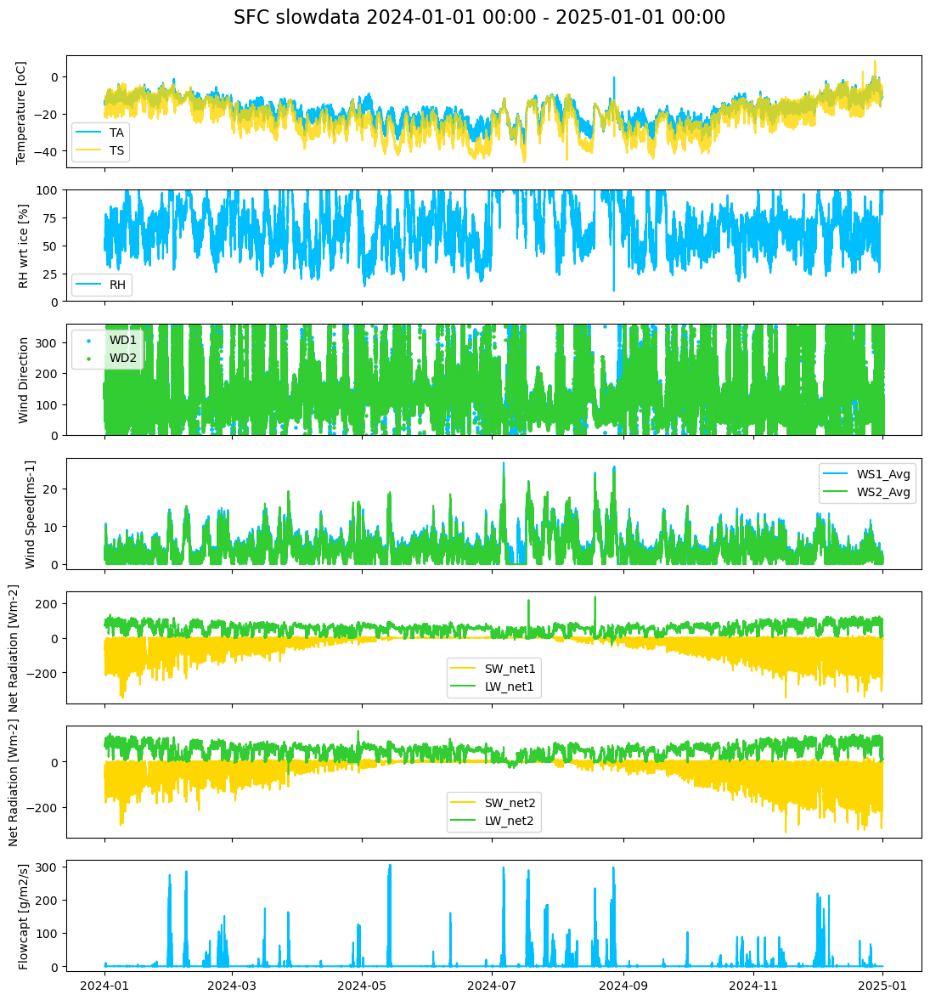

In [12]:
"""READ AND CLEAN SLOWDATA"""
folder=cryos_path+'CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/converted/'
sensor='SFC'
start='2024-01-01 00:00'
end='2025-01-01 00:00'

"""GET SENSOR INFO"""
plim, calibration_coefficients, heights = get_sensor_info(sensor, 2024)

"""READ FAST AND SLOW DATA from folder"""
slowdata=read_data(folder, 'slow', sensor, start, end, plot_data=False)

"""CLEAN SLOWDATA"""
slowdata_cleaned=clean_slowdata(slowdata)
plot_SFC_slowdata(slowdata_cleaned, sensor, start, end)




In [13]:
"""READ SPC FILES"""
SPC_filenames = []
SPC_folder=cryos_path+'CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/SPC/SPC_OneMin_processed/'
file_list = sorted(glob.glob(os.path.join(SPC_folder, '*.txt')))
for file in file_list:
    SPC_filenames.append(file)
SPC=getRawData(SPC_filenames)


In [14]:
"""ADD POT TEMPERATURE AND TI TO DFS, THEN CREATE DFS WITH SYNCHRONIZED NANS IN 30MIN INTERVALS"""
p0 = 100000  # Reference pressure in Pa (1000 hPa)
R_d_over_cp = 0.286  # Rd / cp for dry air
# Compute potential temperature (theta
fluxes_SFC['theta'] = fluxes_SFC['air_temperature'] * (p0 / fluxes_SFC['air_pressure'])**R_d_over_cp
fluxes_SFC['theta_v'] = fluxes_SFC['theta'] * (1 + 0.61 * fluxes_SFC['specific_humidity'])
fluxes_16m['theta'] = fluxes_16m['air_temperature'] * (p0 / fluxes_16m['air_pressure'])**R_d_over_cp
fluxes_16m['theta_v'] = fluxes_16m['theta'] * (1 + 0.61 * fluxes_16m['specific_humidity'])
fluxes_26m['theta'] = fluxes_26m['air_temperature'] * (p0 / fluxes_26m['air_pressure'])**R_d_over_cp
fluxes_26m['theta_v'] = fluxes_26m['theta'] * (1 + 0.61 * fluxes_26m['specific_humidity'])

fluxes_SFC['TI']= np.sqrt(fluxes_SFC['u_var']**2 + fluxes_SFC['v_var']**2 + fluxes_SFC['w_var']**2) / fluxes_SFC['wind_speed']
fluxes_16m['TI']= np.sqrt(fluxes_16m['u_var']**2 + fluxes_16m['v_var']**2 + fluxes_16m['w_var']**2) / fluxes_16m['wind_speed']
fluxes_26m['TI']= np.sqrt(fluxes_26m['u_var']**2 + fluxes_26m['v_var']**2 + fluxes_26m['w_var']**2) / fluxes_26m['wind_speed']

def synchronize_nans_all_columns(*dfs):
    """
    Synchronizes NaN values across multiple DataFrames for all columns based on their timestamps.

    Parameters:
        *dfs: Variable number of pandas DataFrames to synchronize.

    Returns:
        A tuple of DataFrames with synchronized NaN values for all columns.
    """
    # Create a continuous datetime index from start to end with the desired frequency
    for df in dfs:
        df=resample_with_threshold(df, '30min', True, '30min', 80)
    continuous_index = pd.date_range(start=start, end=end, freq='30min')
    
    # Reindex each DataFrame to ensure continuity and fill missing timestamps with NaN
    synced_dfs = [df.reindex(continuous_index) for df in dfs]
    
    # Synchronize NaN values across all columns
    for i, df in enumerate(synced_dfs):
        for col in df.columns:
            for other_df in synced_dfs:
                if col in other_df.columns:
                    df.loc[other_df[col].isna(), col] = np.nan
    
    return tuple(synced_dfs)

fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced = synchronize_nans_all_columns(fluxes_SFC, fluxes_16m, fluxes_26m)

"""COMPUTE RICHARDSON BULK NUMBER"""
g=9.81

delta_theta_v=fluxes_26m_synced['theta'] - fluxes_SFC_synced['theta']
dz=26-2
T_v=resample_with_threshold(fluxes_SFC['air_temperature']*(1 + 0.61 * fluxes_SFC['specific_humidity']),'30min')
delta_u=fluxes_26m_synced['u_unrot'] - fluxes_SFC_synced['u_unrot']
delta_v=fluxes_26m_synced['v_unrot'] - fluxes_SFC_synced['v_unrot']
Ri_b= (g*delta_theta_v*dz) / (T_v*(delta_u**2 + delta_v**2))
fluxes_26m_synced['Ri_b'] = Ri_b


delta_theta_v=slowdata_cleaned['TA'] +273.15 - slowdata_cleaned['SFTempK']
Ri_b_surf = g * 1 * delta_theta_v / (slowdata_cleaned['SFTempK'] * slowdata_cleaned['WS2_Avg']**2)
Ri_b_surf = Ri_b_surf.where(slowdata_cleaned['WS2_Avg'] > 0.4)
slowdata_cleaned['Ri_b_surf'] = Ri_b_surf

(<Figure size 1300x1800 with 10 Axes>,
 array([<Axes: ylabel='Temperature [oC]'>, <Axes: ylabel='RH wrt ice [%]'>,
        <Axes: ylabel='Wind Direction'>,
        <Axes: ylabel='Wind Speed [ms-1]'>,
        <Axes: ylabel='Net Radiation [Wm-2]'>, <Axes: ylabel='HS_Cor [m]'>,
        <Axes: ylabel='Mass flux [g/m2/s]'>, <Axes: ylabel='H [Wm-2]'>,
        <Axes: ylabel='LE [Wm-2]'>], dtype=object))

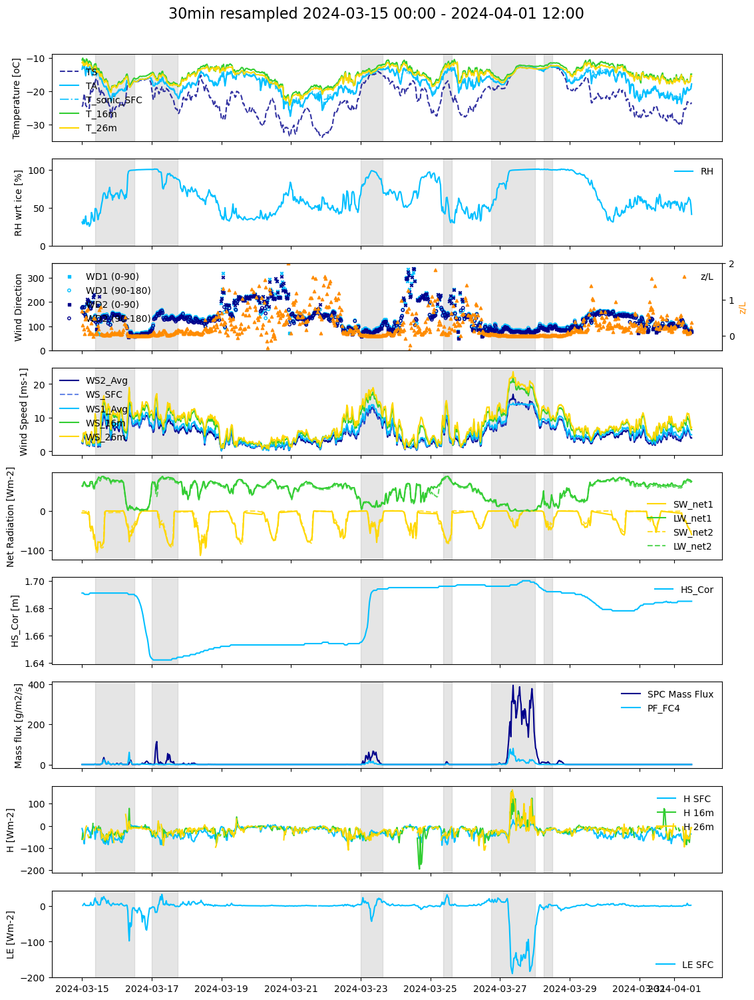

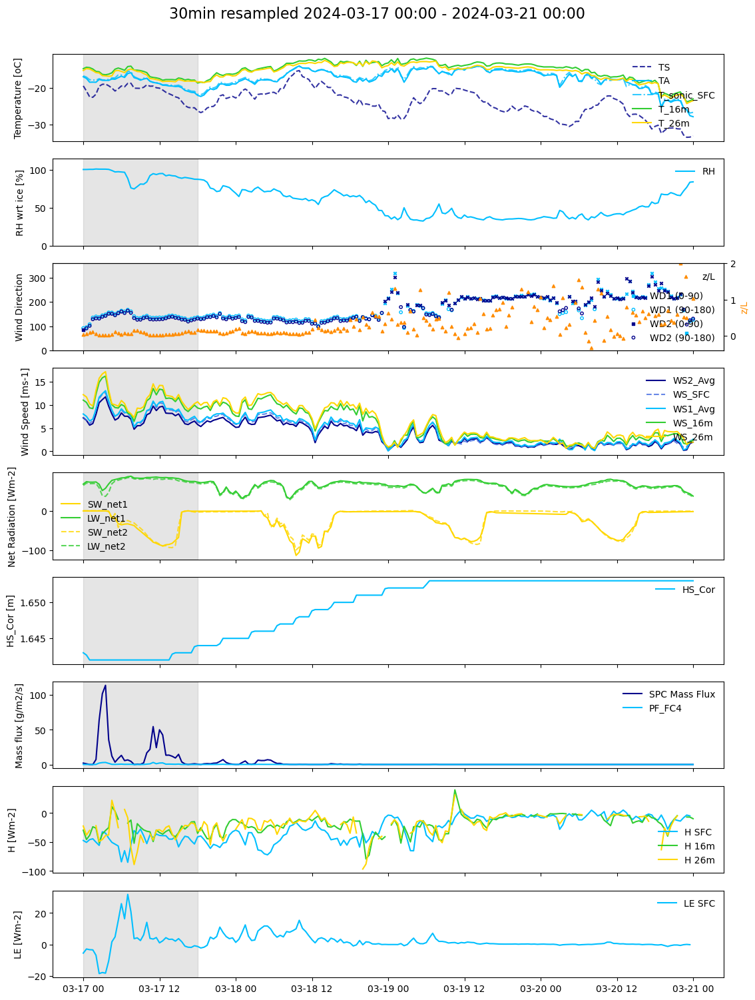

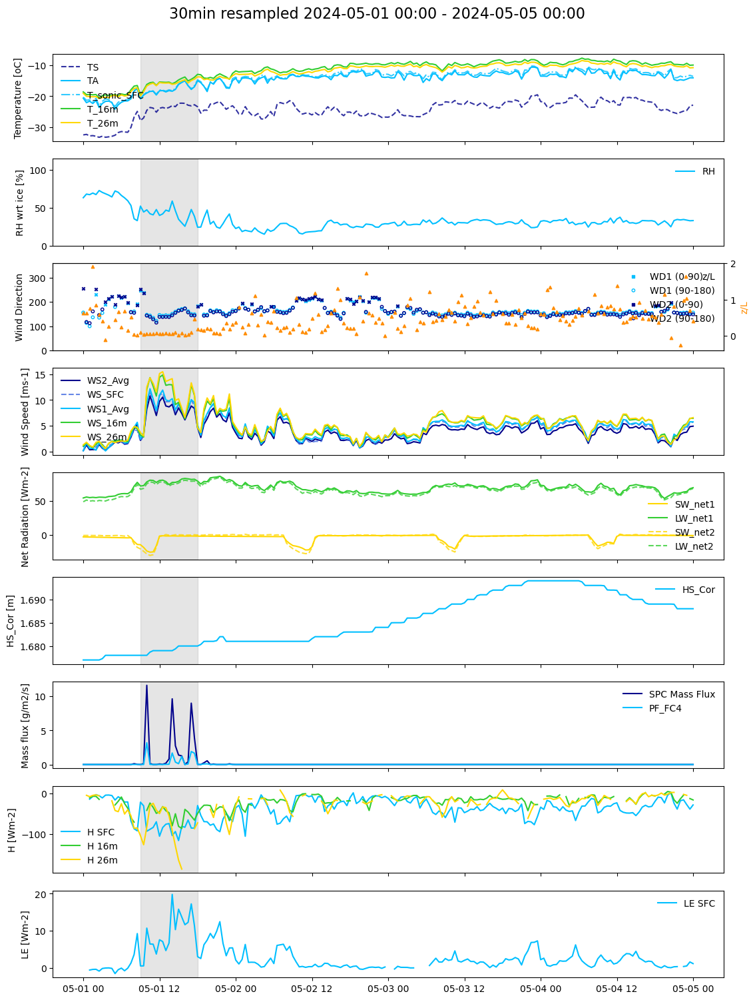

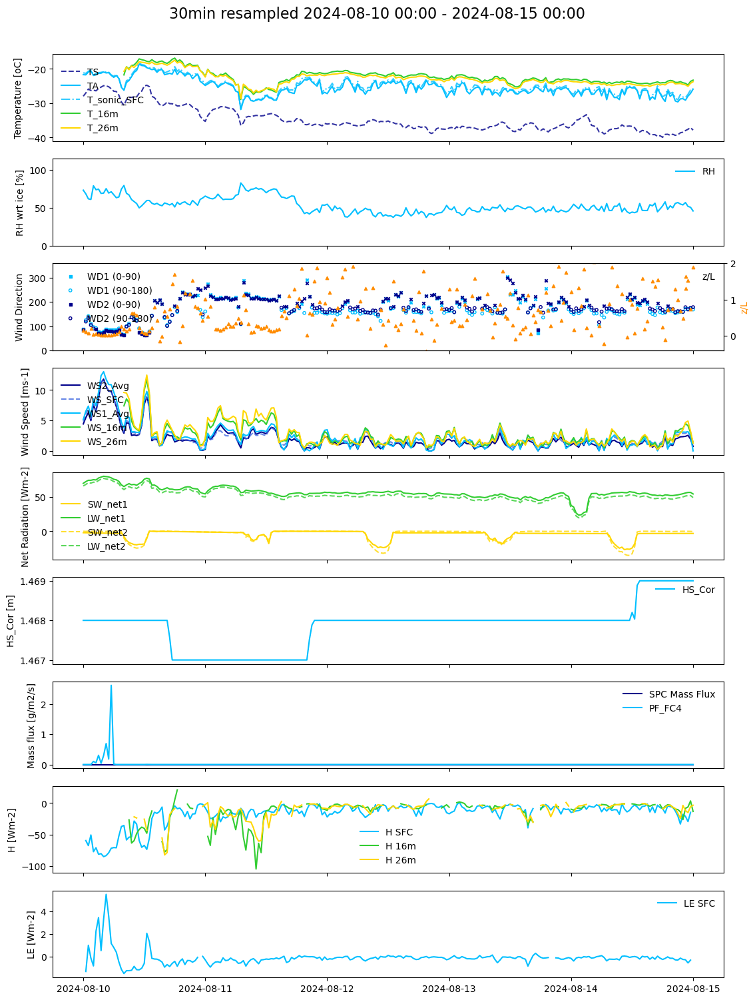

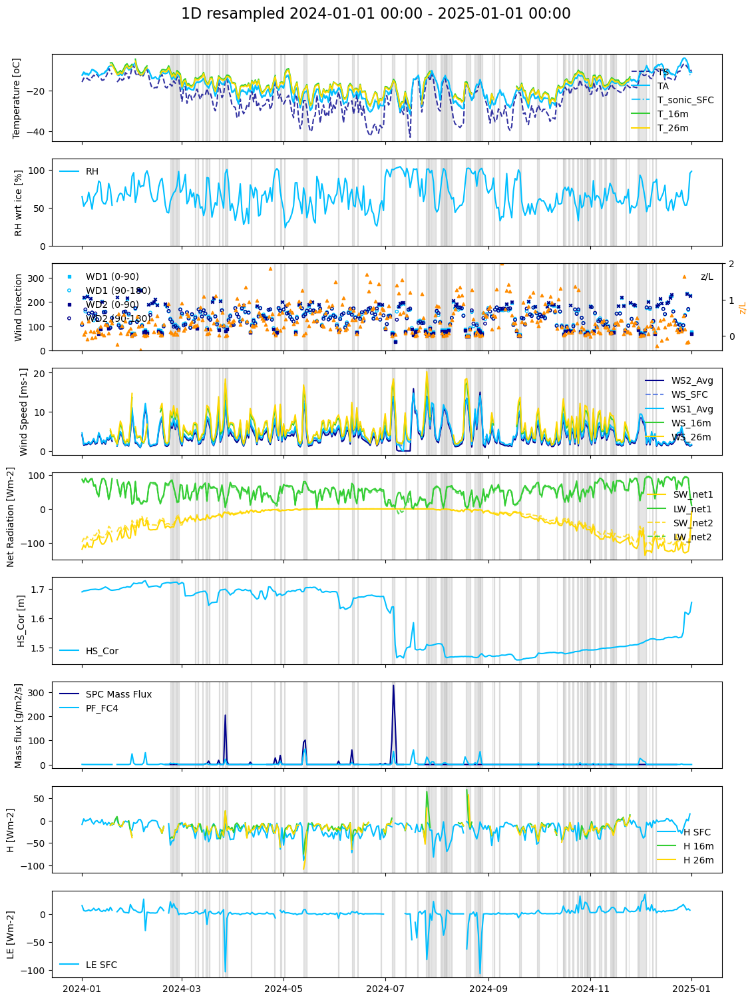

In [19]:
""""PLOT TIMESERIES AND DEFINE START AND END, GREY BARS GIVE BS PERIODS >3h"""
# """PLOT SLOWDATA AND FLUXES"""
start='2024-03-15 00:00'
end='2024-04-01 12:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end, SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-03-17 00:00'
end='2024-03-21 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-05-01 00:00'
end='2024-05-05 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-08-10 00:00'
end='2024-08-15 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-01-01 00:00'
end='2025-01-01 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='1D', interpolate=True, interp_time='30min')

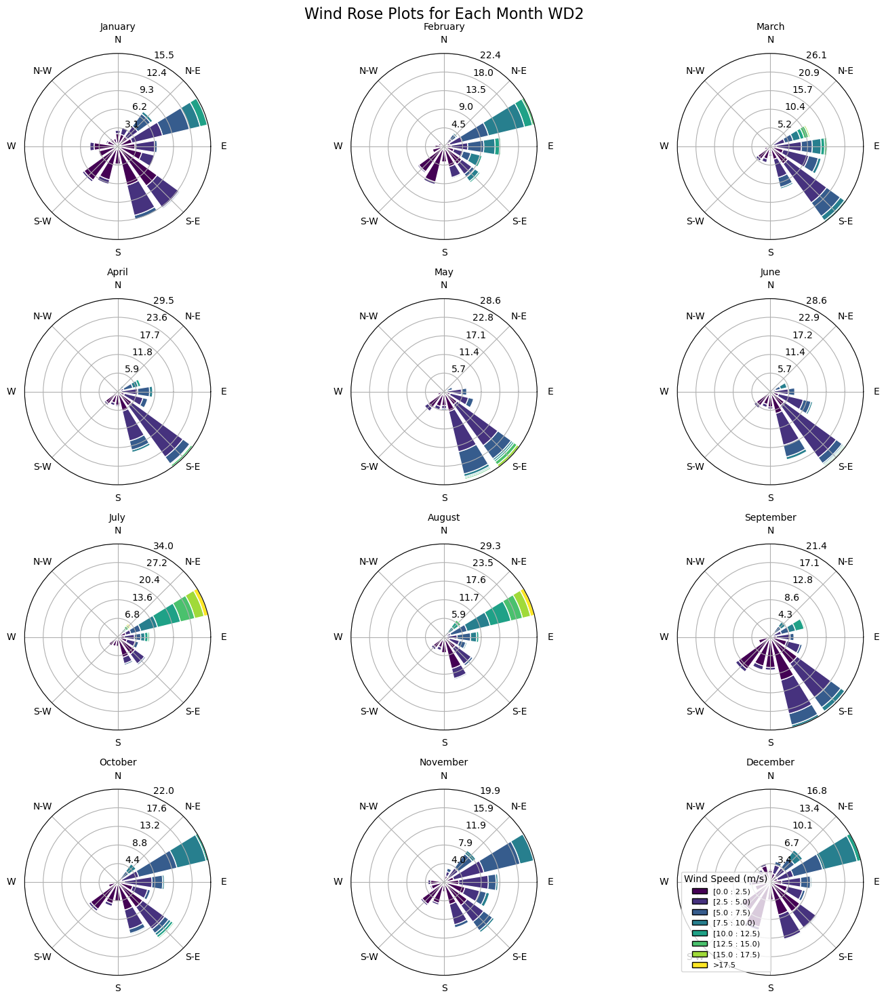

In [ ]:
"""PLOT WIND ROSE"""
# Add a new column for the month name
slowdata_cleaned['Month_Name'] = slowdata_cleaned.index.month_name()
# Create a new column for the month
slowdata_cleaned['Month'] = slowdata_cleaned.index.month
# Initialize the figure
fig = plt.figure(figsize=(15, 15))
# Define a consistent color map for wind speed
cmap = plt.cm.viridis
# Loop through each month and create a wind rose
for month in range(1, 13):
    ax = fig.add_subplot(4, 3, month, projection='windrose')
    monthly_data = slowdata_cleaned[slowdata_cleaned['Month'] == month]
    bars = ax.bar(
        monthly_data['WD2'], 
        monthly_data['WS2_Avg'], 
        normed=True, 
        opening=0.8, 
        edgecolor='white', 
        cmap=cmap, 
        bins=np.arange(0, 20, 2.5)  # Set bins with increments of 3 m/s
    )
    ax.set_title(f"{slowdata_cleaned['Month_Name'][slowdata_cleaned['Month'] == month].iloc[0]}", fontsize=10)

# Add legends directly to each subplot
ax.legend(
    loc='lower left', 
    fontsize=8, 
    title="Wind Speed (m/s)"
)
plt.suptitle('Wind Rose Plots for Each Month WD2', fontsize=16, y=0.98)
# Adjust layout and show the plot
plt.tight_layout()
plt.savefig(save_path+'WD2_SFC_slowdata_windrose_year.png', bbox_inches='tight', dpi=300)
plt.show()

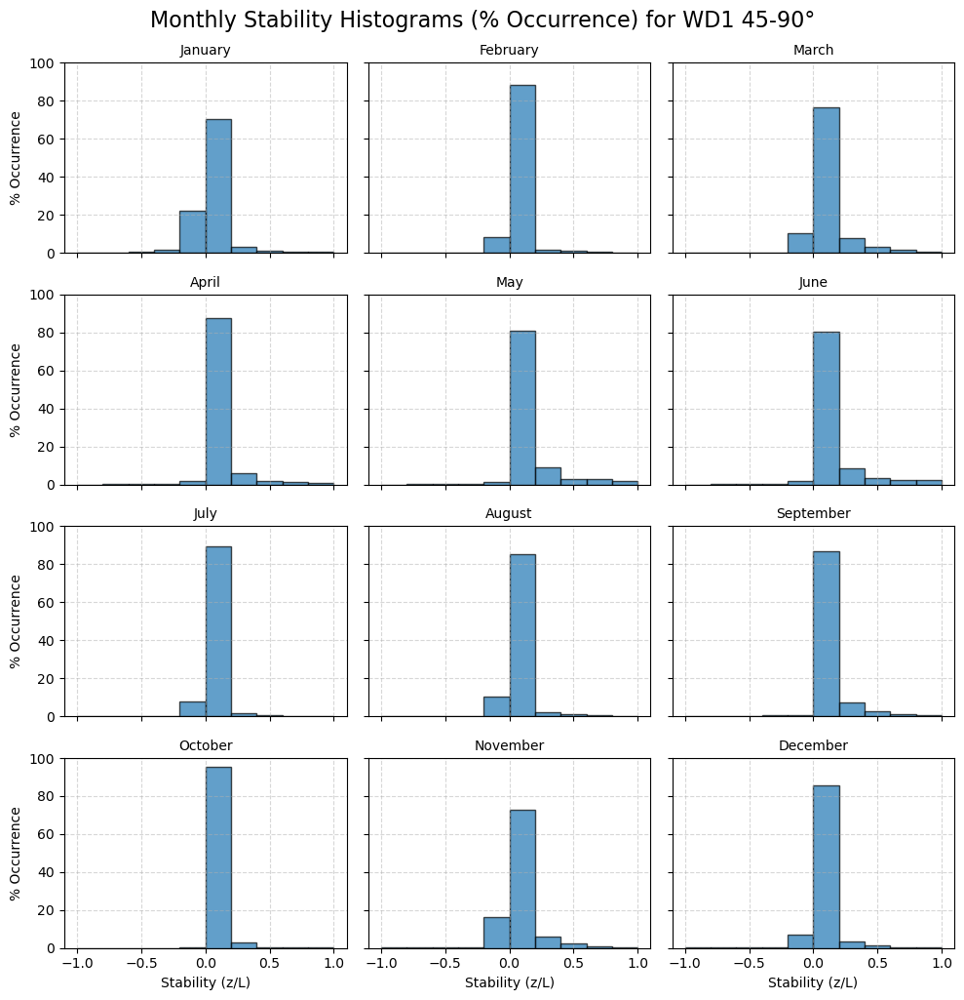

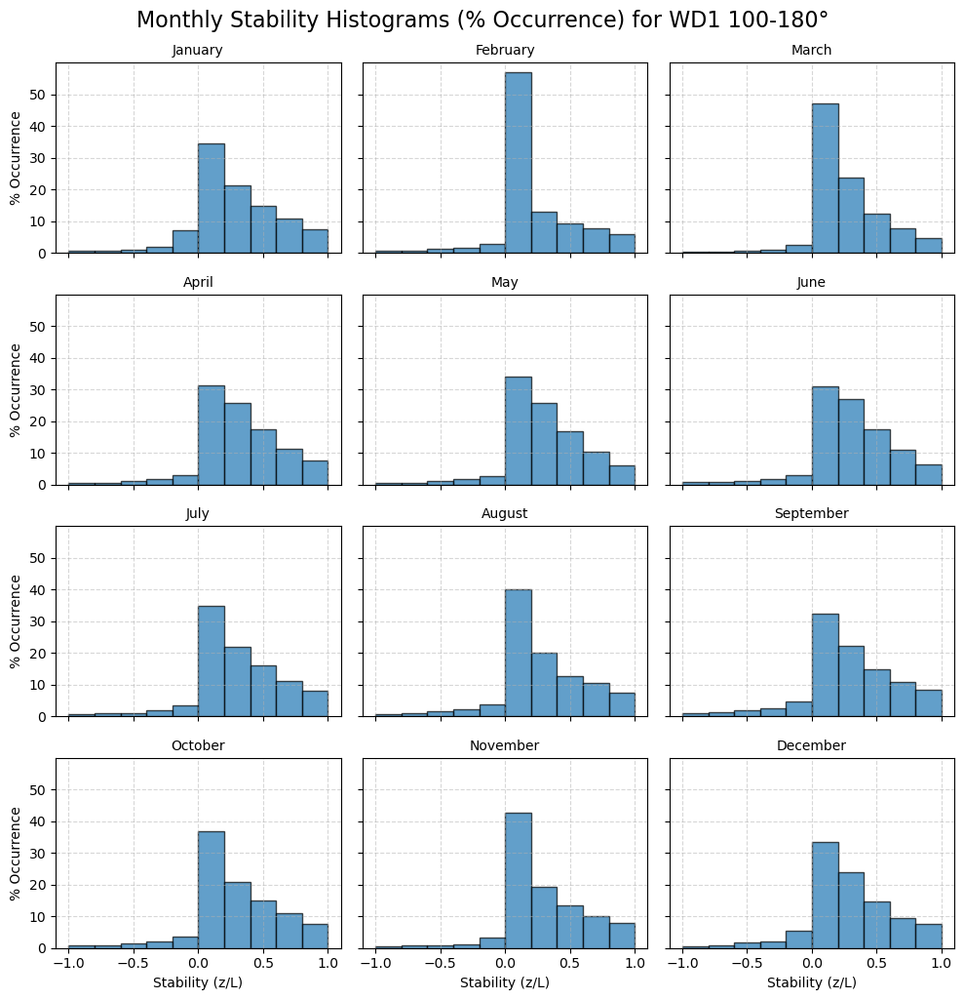

In [ ]:
"""RANDOM PLOT FOR STABILITY"""
# Define the bins for stability
bins = np.arange(-1, 1.2, 0.2)

# Add a 'Month' column to group data by month
fluxes_SFC['Month'] = fluxes_SFC.index.month
fluxes_SFC['Month_Name'] = fluxes_SFC.index.month_name()

# Prepare WD1 from slowdata_cleaned, resampled to match fluxes_SFC index
wd1_resampled = slowdata_cleaned['WD1'].reindex(fluxes_SFC.index, method='nearest')

# Define WD1 ranges
wd1_ranges = {
    'WD1 45-90°': (45, 90),
    'WD1 100-180°': (100, 180)
}

for label, (wd1_min, wd1_max) in wd1_ranges.items():
    fig, axes = plt.subplots(4, 3, figsize=(10, 10), sharex=True, sharey=True)
    axes = axes.flatten()
    for month in range(1, 13):
        ax = axes[month - 1]
        # Filter for current month and WD1 range
        mask = (fluxes_SFC['Month'] == month) & (wd1_resampled >= wd1_min) & (wd1_resampled <= wd1_max)
        monthly_data = fluxes_SFC.loc[mask, '(z-d)/L']
        filtered_data = monthly_data[(monthly_data >= -1) & (monthly_data <= 1)]
        # Calculate percentage for each bin
        counts, _ = np.histogram(filtered_data, bins=bins)
        total = counts.sum()
        percentages = 100 * counts / total if total > 0 else np.zeros_like(counts)
        ax.bar(bins[:-1], percentages, width=np.diff(bins), edgecolor='black', alpha=0.7, align='edge')
        if not fluxes_SFC['Month_Name'][fluxes_SFC['Month'] == month].empty:
            ax.set_title(f"{fluxes_SFC['Month_Name'][fluxes_SFC['Month'] == month].iloc[0]}", fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.5)
        if month % 3 == 1:
            ax.set_ylabel("% Occurrence")
        if month > 9:
            ax.set_xlabel("Stability (z/L)")
    plt.tight_layout()
    plt.suptitle(f"Monthly Stability Histograms (% Occurrence) for {label}", fontsize=16, y=1.02)
    plt.show()

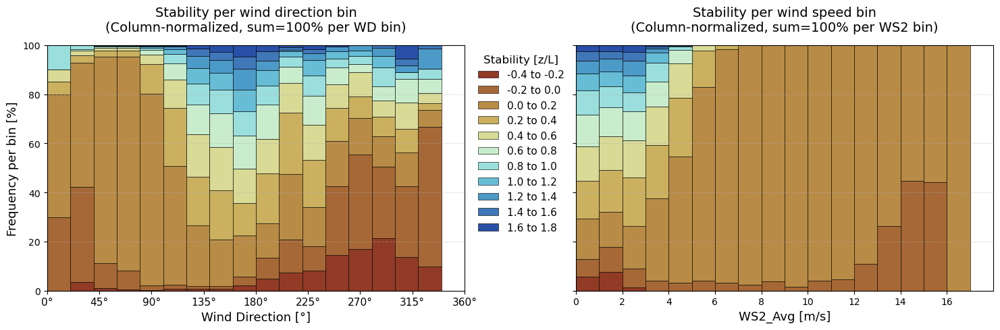

In [ ]:
"""STABILITY OCCURENCE PER WIND DIRECTION AND WIND SPEED"""
stability_bins = np.arange(-0.4, 1.9, 0.2)
stability_labels = [f"{stability_bins[i]:.1f} to {stability_bins[i+1]:.1f}" for i in range(len(stability_bins)-1)]

# Align wind direction and stability index
wd = resample_with_threshold(slowdata_cleaned['WD2'], '30min').reindex(fluxes_SFC.index, method='nearest')
stability = resample_with_threshold(fluxes_SFC['(z-d)/L'], '30min')

# Prepare wind direction bins
wd_bins = np.arange(0, 361, 20)  # 20-degree bins
wd_centers = wd_bins[:-1] + np.diff(wd_bins) / 2

# Prepare wind speed bins
ws_bins = np.arange(0, 20, 1)
ws_centers = ws_bins[:-1] + np.diff(ws_bins) / 2
ws2 = resample_with_threshold(slowdata_cleaned['WS2_Avg'], '30min').reindex(fluxes_SFC.index, method='nearest')

# Initialize matrices to hold counts for each (stability, wind direction/wind speed) bin
counts_matrix_wd = np.zeros((len(stability_bins)-1, len(wd_bins)-1))
counts_matrix_ws = np.zeros((len(stability_bins)-1, len(ws_bins)-1))

# Fill the matrices
for i, (left, right) in enumerate(zip(stability_bins[:-1], stability_bins[1:])):
    mask = (stability >= left) & (stability < right)
    # Wind direction
    wd_class = wd[mask & wd.notna()]
    counts_wd, _ = np.histogram(wd_class, bins=wd_bins)
    counts_matrix_wd[i, :] = counts_wd
    # Wind speed
    ws_class = ws2[mask & ws2.notna()]
    counts_ws, _ = np.histogram(ws_class, bins=ws_bins)
    counts_matrix_ws[i, :] = counts_ws

# Normalize so that for each bin, the sum over stability bins is 100%
col_sums_wd = counts_matrix_wd.sum(axis=0)
percent_matrix_wd = np.zeros_like(counts_matrix_wd)
for j in range(len(wd_bins)-1):
    if col_sums_wd[j] > 0:
        percent_matrix_wd[:, j] = 100 * counts_matrix_wd[:, j] / col_sums_wd[j]

col_sums_ws = counts_matrix_ws.sum(axis=0)
percent_matrix_ws = np.zeros_like(counts_matrix_ws)
for j in range(len(ws_bins)-1):
    if col_sums_ws[j] > 0:
        percent_matrix_ws[:, j] = 100 * counts_matrix_ws[:, j] / col_sums_ws[j]

# Plot as grouped bar chart with scientific style
fig, axes = plt.subplots(1, 2, figsize=(18, 5), sharey=True)
cmap = cm.roma
colors = cmap(np.linspace(0, 1, len(stability_labels)))

# Wind direction subplot
bottom = np.zeros(len(wd_bins)-1)
for i, (label, color) in enumerate(zip(stability_labels, colors)):
    axes[0].bar(
        wd_centers, percent_matrix_wd[i], width=np.diff(wd_bins), bottom=bottom,
        alpha=0.85, align='center', label=label, color=color, edgecolor='black', linewidth=0.5
    )
    bottom += percent_matrix_wd[i]
axes[0].set_xlabel('Wind Direction [°]', fontsize=13)
axes[0].set_ylabel('Frequency per bin [%]', fontsize=13)
axes[0].set_title('Stability per wind direction bin\n(Column-normalized, sum=100% per WD bin)', fontsize=14, pad=15)
axes[0].set_xticks(np.arange(0, 361, 45))
axes[0].set_xticklabels([f"{int(x)}°" for x in np.arange(0, 361, 45)], fontsize=11)
axes[0].set_xlim(0, 360)
axes[0].set_ylim(0, 100)
axes[0].grid(axis='y', linestyle='--', alpha=0.4, zorder=0)
axes[0].legend(
    title='Stability [z/L]', bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=11, title_fontsize=12, frameon=False
)

# Wind speed subplot
bottom = np.zeros(len(ws_bins)-1)
for i, (label, color) in enumerate(zip(stability_labels, colors)):
    axes[1].bar(
        ws_centers, percent_matrix_ws[i], width=np.diff(ws_bins), bottom=bottom,
        alpha=0.85, align='center', label=label, color=color, edgecolor='black', linewidth=0.5
    )
    bottom += percent_matrix_ws[i]
axes[1].set_xlabel('WS2_Avg [m/s]', fontsize=13)
axes[1].set_title('Stability per wind speed bin\n(Column-normalized, sum=100% per WS2 bin)', fontsize=14, pad=15)
axes[1].set_xticks(np.arange(0, 18, 2))
axes[1].set_xlim(0, 18)
axes[1].set_ylim(0, 100)
axes[1].grid(axis='y', linestyle='--', alpha=0.4, zorder=0)

plt.tight_layout(rect=[0, 0, 0.87, 1])
plt.subplots_adjust(right=0.82)
plt.savefig(save_path+'10_wdir_stab.png', bbox_inches='tight', dpi=300)

plt.show()

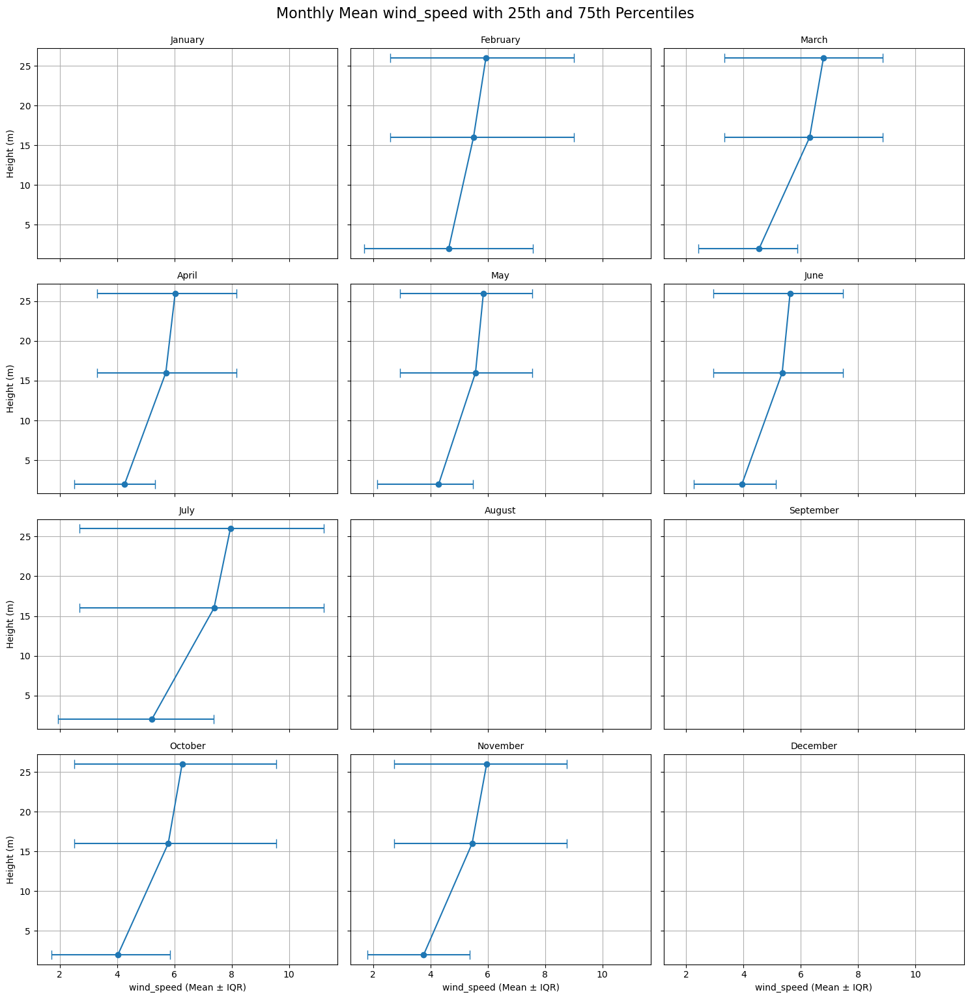

In [196]:
def plot_monthly_mean_H(fluxes_SFC, fluxes_16m, fluxes_26m, heights, variable):
    """
    Plots the monthly mean H with 25th and 75th percentiles for different heights.

    Parameters:
        fluxes_SFC (pd.DataFrame): DataFrame containing SFC flux data.
        fluxes_16m (pd.DataFrame): DataFrame containing 16m flux data.
        fluxes_26m (pd.DataFrame): DataFrame containing 26m flux data.
        heights (list): List of heights corresponding to SFC, 16m, and 26m.
        resample_func (function): Function to resample data with a threshold.
    """
    # Add a 'Month' column to group data by month
    fluxes_SFC['Month'] = fluxes_SFC.index.month
    fluxes_16m['Month'] = fluxes_16m.index.month
    fluxes_26m['Month'] = fluxes_26m.index.month

    # Add a 'Month_Name' column to include the name of the month
    fluxes_SFC['Month_Name'] = fluxes_SFC.index.month_name()
    fluxes_16m['Month_Name'] = fluxes_16m.index.month_name()
    fluxes_26m['Month_Name'] = fluxes_26m.index.month_name()

    # Initialize the figure
    fig, axes = plt.subplots(4, 3, figsize=(15, 15), sharey=True, sharex=True)
    axes = axes.flatten()

    # Loop through each month and create subplots
    for month in range(1, 13):
        ax = axes[month - 1]
        
        # Filter data for the current month
        sfc_month = fluxes_SFC[fluxes_SFC['Month'] == month][variable]
        m16_month = fluxes_16m[fluxes_16m['Month'] == month][variable]
        m26_month = fluxes_26m[fluxes_26m['Month'] == month][variable]
        
        # Calculate mean, 25th, and 75th percentiles
        means = [
            resample_with_threshold(sfc_month, '1ME', True, '30min', 70).mean() if not sfc_month.empty else np.nan, 
            resample_with_threshold(m16_month, '1ME', True, '3h', 70).mean() if not m16_month.empty else np.nan, 
            resample_with_threshold(m26_month, '1ME', True, '3h', 70).mean() if not m26_month.empty else np.nan
        ]
        percentiles_25 = [sfc_month.quantile(0.25), m16_month.quantile(0.25), m16_month.quantile(0.25)]
        percentiles_75 = [sfc_month.quantile(0.75), m26_month.quantile(0.75), m26_month.quantile(0.75)]
        
        # Plot the means with whiskers
        ax.errorbar(
            means, heights, 
            xerr=[np.array(means) - np.array(percentiles_25), np.array(percentiles_75) - np.array(means)], 
            fmt='o-', capsize=5, label='H'
        )
        
        # Set titles and labels
        if not fluxes_SFC['Month_Name'][fluxes_SFC['Month'] == month].empty:
            ax.set_title(f"{fluxes_SFC['Month_Name'][fluxes_SFC['Month'] == month].iloc[0]}", fontsize=10)
        else:
            ax.set_title(f"Month {month}", fontsize=10)
        if month % 3 == 1:  # First column
            ax.set_ylabel("Height (m)")
        if month > 9:  # Last row
            ax.set_xlabel(f"{variable} (Mean ± IQR)")
        ax.grid(True)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.suptitle(f"Monthly Mean {variable} with 25th and 75th Percentiles", fontsize=16, y=1.02)
    plt.show()

# Example usage
plot_monthly_mean_H(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, heights=[2, 16, 26], variable='wind_speed')

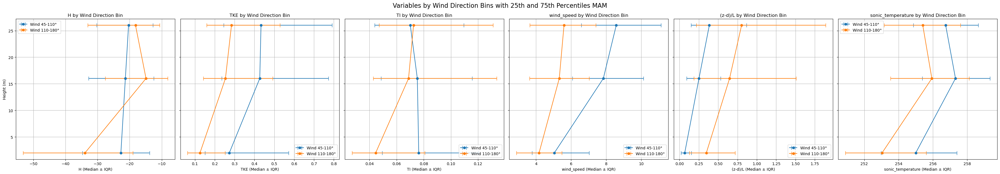

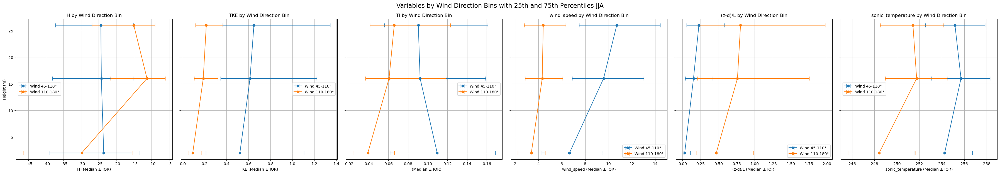

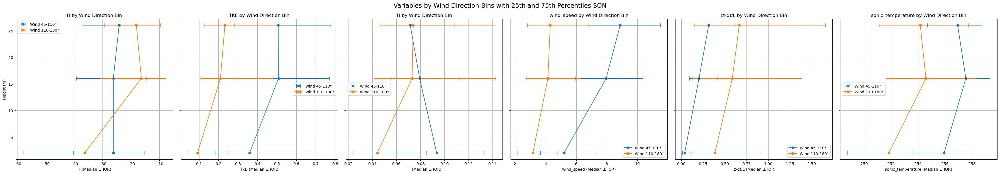

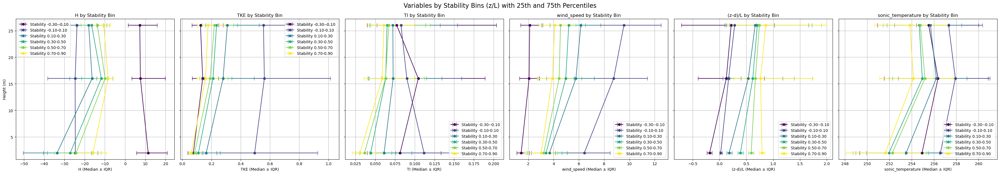

In [ ]:
"""PLOTS FOR MEDIAN AND IQR FOR DIFFERENT HEIGHTS GROUED BY WIND AND STABILITY BINS"""
def plot_wind_direction_binned(fluxes_SFC, fluxes_16m, fluxes_26m, slowdata, heights, variables, month):
    """
    Plots the mean and IQR for different heights, grouped into wind direction bins,
    for each variable in `variables`. Each variable gets its own subplot, and both
    wind direction bins are shown in the same subplot.

    Parameters:
        fluxes_SFC (pd.DataFrame): DataFrame containing SFC flux data.
        fluxes_16m (pd.DataFrame): DataFrame containing 16m flux data.
        fluxes_26m (pd.DataFrame): DataFrame containing 26m flux data.
        slowdata (pd.DataFrame): DataFrame containing wind direction data.
        heights (list): List of heights corresponding to SFC, 16m, and 26m.
        variables (list): List of variables to plot.
    """

    # Define wind direction bins (e.g., 45-110, 110-180)
    bins = [45, 110, 180]
    bin_labels = [f"{int(bins[i])}-{int(bins[i+1])}°" for i in range(len(bins) - 1)]
    slowdata_mean = slowdata.resample('30min').mean()
    slowdata_mean['Wind_Bin'] = pd.cut(slowdata_mean['WD2'], bins=bins, labels=bin_labels, include_lowest=True)

    # Add wind direction bins to flux data
    fluxes_SFC = fluxes_SFC.copy()
    fluxes_16m = fluxes_16m.copy()
    fluxes_26m = fluxes_26m.copy()
    fluxes_SFC['Wind_Bin'] = slowdata_mean['Wind_Bin']
    fluxes_16m['Wind_Bin'] = slowdata_mean['Wind_Bin']
    fluxes_26m['Wind_Bin'] = slowdata_mean['Wind_Bin']

    n_vars = len(variables)
    fig, axes = plt.subplots(1, n_vars, figsize=(6 * n_vars, 6), sharey=True)
    if n_vars == 1:
        axes = [axes]

    colors = ['tab:blue', 'tab:orange']
    for ax, variable in zip(axes, variables):
        for j, wind_bin in enumerate(bin_labels):
            # Filter data for the current wind direction bin
            sfc_bin = fluxes_SFC[fluxes_SFC['Wind_Bin'] == wind_bin][variable]
            m16_bin = fluxes_16m[fluxes_16m['Wind_Bin'] == wind_bin][variable]
            m26_bin = fluxes_26m[fluxes_26m['Wind_Bin'] == wind_bin][variable]
            # Calculate median, 25th, and 75th percentiles
            means = [
                sfc_bin.median() if not sfc_bin.empty else np.nan,
                m16_bin.median() if not m16_bin.empty else np.nan,
                m26_bin.median() if not m26_bin.empty else np.nan
            ]
            percentiles_25 = [
                sfc_bin.quantile(0.25) if not sfc_bin.empty else np.nan,
                m16_bin.quantile(0.25) if not m16_bin.empty else np.nan,
                m26_bin.quantile(0.25) if not m26_bin.empty else np.nan
            ]
            percentiles_75 = [
                sfc_bin.quantile(0.75) if not sfc_bin.empty else np.nan,
                m16_bin.quantile(0.75) if not m16_bin.empty else np.nan,
                m26_bin.quantile(0.75) if not m26_bin.empty else np.nan
            ]
            lower_error = np.maximum(0, np.array(means) - np.array(percentiles_25))
            upper_error = np.maximum(0, np.array(percentiles_75) - np.array(means))

            ax.errorbar(
                means, heights,
                xerr=[lower_error, upper_error],
                fmt='o-', capsize=5, label=f'Wind {wind_bin}', color=colors[j]
            )

        ax.set_title(f"{variable} by Wind Direction Bin", fontsize=12)
        ax.set_xlabel(f"{variable} (Median ± IQR)")
        ax.grid(True)
        if ax == axes[0]:
            ax.set_ylabel("Height (m)")
        ax.legend()

    plt.tight_layout()
    plt.suptitle(f"Variables by Wind Direction Bins with 25th and 75th Percentiles {month}", fontsize=16, y=1.04)
    plt.savefig(save_path+f'wind_direction_bins_{month}.png', bbox_inches='tight', dpi=300)
    # plt.show()
    
def plot_stability_binned(fluxes_SFC, fluxes_16m, fluxes_26m, slowdata, heights, variables):
    """
    Plots the median and IQR for different heights, grouped into stability bins
    based on (z-d)/L from fluxes_SFC, for each variable in `variables`.
    Each variable gets its own subplot, and all stability bins are shown in the same subplot.

    Parameters:
        fluxes_SFC (pd.DataFrame): DataFrame containing SFC flux data.
        fluxes_16m (pd.DataFrame): DataFrame containing 16m flux data.
        fluxes_26m (pd.DataFrame): DataFrame containing 26m flux data.
        heights (list): List of heights corresponding to SFC, 16m, and 26m.
        variables (list): List of variables to plot.
    """

    # Define stability bins (0 to 1 in steps of 0.25)
    bins = np.arange(-0.3, 1, 0.2)
    bin_labels = [f"{bins[i]:.2f}-{bins[i+1]:.2f}" for i in range(len(bins) - 1)]
    # Bin by SFC (z-d)/L
    fluxes_SFC = fluxes_SFC.copy()
    fluxes_16m = fluxes_16m.copy()
    fluxes_26m = fluxes_26m.copy()
    fluxes_SFC['Stability_Bin'] = pd.cut(fluxes_SFC['(z-d)/L'], bins=bins, labels=bin_labels, include_lowest=True)
    fluxes_16m['Stability_Bin'] = fluxes_SFC['Stability_Bin']
    fluxes_26m['Stability_Bin'] = fluxes_SFC['Stability_Bin']

    n_vars = len(variables)
    fig, axes = plt.subplots(1, n_vars, figsize=(6 * n_vars, 6), sharey=True)
    if n_vars == 1:
        axes = [axes]

    colors = plt.cm.viridis(np.linspace(0, 1, len(bin_labels)))
    for ax, variable in zip(axes, variables):
        for j, stability_bin in enumerate(bin_labels):
            # Filter data for the current stability bin
            sfc_bin = fluxes_SFC[fluxes_SFC['Stability_Bin'] == stability_bin][variable]
            m16_bin = fluxes_16m[fluxes_16m['Stability_Bin'] == stability_bin][variable]
            m26_bin = fluxes_26m[fluxes_26m['Stability_Bin'] == stability_bin][variable]
            # Calculate median, 25th, and 75th percentiles
            means = [
                sfc_bin.median() if not sfc_bin.empty else np.nan,
                m16_bin.median() if not m16_bin.empty else np.nan,
                m26_bin.median() if not m26_bin.empty else np.nan
            ]
            percentiles_25 = [
                sfc_bin.quantile(0.25) if not sfc_bin.empty else np.nan,
                m16_bin.quantile(0.25) if not m16_bin.empty else np.nan,
                m26_bin.quantile(0.25) if not m26_bin.empty else np.nan
            ]
            percentiles_75 = [
                sfc_bin.quantile(0.75) if not sfc_bin.empty else np.nan,
                m16_bin.quantile(0.75) if not m16_bin.empty else np.nan,
                m26_bin.quantile(0.75) if not m26_bin.empty else np.nan
            ]
            lower_error = np.maximum(0, np.array(means) - np.array(percentiles_25))
            upper_error = np.maximum(0, np.array(percentiles_75) - np.array(means))

            ax.errorbar(
                means, heights,
                xerr=[lower_error, upper_error],
                fmt='o-', capsize=5, label=f'Stability {stability_bin}', color=colors[j]
            )

        ax.set_title(f"{variable} by Stability Bin", fontsize=12)
        ax.set_xlabel(f"{variable} (Median ± IQR)")
        ax.grid(True)
        if ax == axes[0]:
            ax.set_ylabel("Height (m)")
        ax.legend()

    plt.tight_layout()
    plt.suptitle("Variables by Stability Bins (z/L) with 25th and 75th Percentiles", fontsize=16, y=1.04)
    plt.savefig(save_path+'stability_bins.png', bbox_inches='tight', dpi=300)
    # plt.show()

def plot_stability_binned_Ri(fluxes_SFC, fluxes_16m, fluxes_26m, slowdata, Ri_b, heights, variables):
    """
    Plots the median and IQR for different heights, grouped into stability bins
    based on (z-d)/L from fluxes_SFC, for each variable in `variables`.
    Each variable gets its own subplot, and all stability bins are shown in the same subplot.

    Parameters:
        fluxes_SFC (pd.DataFrame): DataFrame containing SFC flux data.
        fluxes_16m (pd.DataFrame): DataFrame containing 16m flux data.
        fluxes_26m (pd.DataFrame): DataFrame containing 26m flux data.
        heights (list): List of heights corresponding to SFC, 16m, and 26m.
        variables (list): List of variables to plot.
    """

    # Define stability bins (0 to 1 in steps of 0.25)
    bins = np.arange(0, 1, 0.1)
    bin_labels = [f"{bins[i]:.2f}-{bins[i+1]:.2f}" for i in range(len(bins) - 1)]
    # Bin by SFC (z-d)/L
    fluxes_SFC = fluxes_SFC.copy()
    fluxes_16m = fluxes_16m.copy()
    fluxes_26m = fluxes_26m.copy()
    fluxes_SFC['Stability_Bin'] = pd.cut(resample_with_threshold(Ri_b, '30min'), bins=bins, labels=bin_labels, include_lowest=True)
    fluxes_16m['Stability_Bin'] = fluxes_SFC['Stability_Bin']
    fluxes_26m['Stability_Bin'] = fluxes_SFC['Stability_Bin']

    n_vars = len(variables)
    fig, axes = plt.subplots(1, n_vars, figsize=(6 * n_vars, 6), sharey=True)
    if n_vars == 1:
        axes = [axes]

    colors = plt.cm.viridis(np.linspace(0, 1, len(bin_labels)))
    for ax, variable in zip(axes, variables):
        for j, stability_bin in enumerate(bin_labels):
            # Filter data for the current stability bin
            sfc_bin = fluxes_SFC[fluxes_SFC['Stability_Bin'] == stability_bin][variable]
            m16_bin = fluxes_16m[fluxes_16m['Stability_Bin'] == stability_bin][variable]
            m26_bin = fluxes_26m[fluxes_26m['Stability_Bin'] == stability_bin][variable]
            # Calculate median, 25th, and 75th percentiles
            means = [
                sfc_bin.median() if not sfc_bin.empty else np.nan,
                m16_bin.median() if not m16_bin.empty else np.nan,
                m26_bin.median() if not m26_bin.empty else np.nan
            ]
            percentiles_25 = [
                sfc_bin.quantile(0.25) if not sfc_bin.empty else np.nan,
                m16_bin.quantile(0.25) if not m16_bin.empty else np.nan,
                m26_bin.quantile(0.25) if not m26_bin.empty else np.nan
            ]
            percentiles_75 = [
                sfc_bin.quantile(0.75) if not sfc_bin.empty else np.nan,
                m16_bin.quantile(0.75) if not m16_bin.empty else np.nan,
                m26_bin.quantile(0.75) if not m26_bin.empty else np.nan
            ]
            lower_error = np.maximum(0, np.array(means) - np.array(percentiles_25))
            upper_error = np.maximum(0, np.array(percentiles_75) - np.array(means))

            ax.errorbar(
                means, heights,
                xerr=[lower_error, upper_error],
                fmt='o-', capsize=5, label=f'Stability {stability_bin}', color=colors[j]
            )

        ax.set_title(f"{variable} by Stability Bin", fontsize=12)
        ax.set_xlabel(f"{variable} (Median ± IQR)")
        ax.grid(True)
        if ax == axes[0]:
            ax.set_ylabel("Height (m)")
        ax.legend()

    plt.tight_layout()
    plt.suptitle("Variables by Stability Bins Richardson_bulk_number with 25th and 75th Percentiles", fontsize=16, y=1.04)
    plt.show()




start = '2024-03-01 00:00'
end = '2024-06-01 00:00'
vars=['H', 'TKE', 'TI', 'wind_speed', '(z-d)/L', 'sonic_temperature']
plot_wind_direction_binned(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variables=vars, month='MAM')

start = '2024-06-01 00:00'
end = '2024-09-01 00:00'
vars=['H', 'TKE', 'TI', 'wind_speed', '(z-d)/L', 'sonic_temperature']
plot_wind_direction_binned(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variables=vars, month='JJA')
start = '2024-09-01 00:00'
end = '2024-12-01 00:00'
vars=['H', 'TKE', 'TI', 'wind_speed', '(z-d)/L', 'sonic_temperature']
plot_wind_direction_binned(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variables=vars, month='SON')

start = '2024-01-01 00:00'
end = '2024-12-01 00:00'
vars=['H', 'TKE', 'TI', 'wind_speed', '(z-d)/L', 'sonic_temperature']
plot_stability_binned(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variables=vars)
# plot_stability_binned_Ri(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], Ri_b_surf, heights=[2, 16, 26], variables=vars)

# plot_wind_direction_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='TKE')
# plot_wind_direction_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='TI')
# plot_wind_direction_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='wind_speed')
# plot_wind_direction_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='(z-d)/L')
# plot_wind_direction_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='sonic_temperature')
# plot_wind_speed_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='TKE')
# plot_wind_speed_binned(fluxes_SFC_synced, fluxes_16m_synced, fluxes_26m_synced, slowdata_cleaned, heights=[2, 16, 26], variable='TI')

# plot_filtered_wind_speed(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variable='TI')
# start = '2024-04-01 00:00'
# end = '2024-05-01 00:00'
# plot_filtered_wind_speed(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variable='TI')
# start = '2024-05-01 00:00'
# end = '2024-06-01 00:00'
# plot_filtered_wind_speed(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variable='TI')
# start = '2024-06-01 00:00'
# end = '2024-07-01 00:00'
# plot_filtered_wind_speed(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variable='TI')
# start = '2024-07-01 00:00'
# end = '2024-08-01 00:00'
# plot_filtered_wind_speed(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variable='TI')
# start = '2024-08-01 00:00'
# end = '2024-09-01 00:00'
# plot_filtered_wind_speed(fluxes_SFC_synced[start:end], fluxes_16m_synced[start:end], fluxes_26m_synced[start:end], slowdata_cleaned[start:end], heights=[2, 16, 26], variable='TI')

(0.0, 1.0)

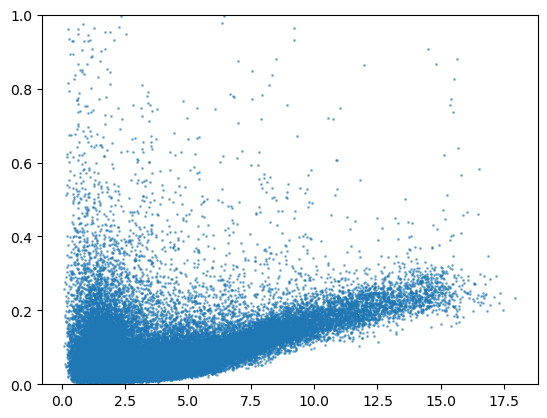

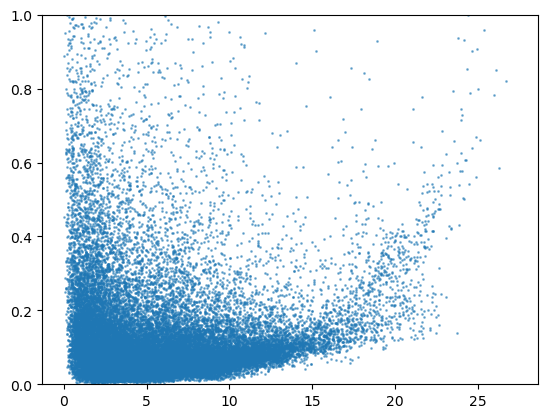

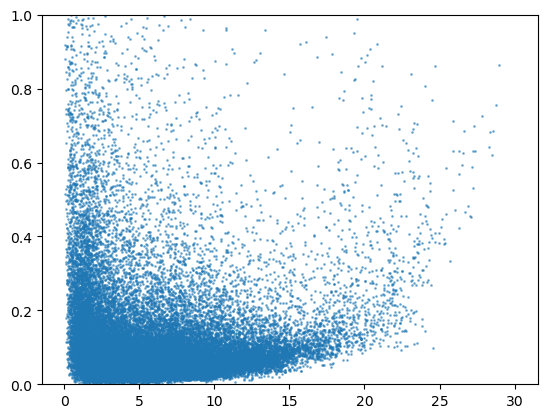

In [ ]:
"""PLOTS FOR TI AND WIND SPEED"""
plt.figure()
plt.scatter(resample_with_threshold(fluxes_SFC['wind_speed'], '10min'), resample_with_threshold(fluxes_SFC['TI'], '10min'), s=1, alpha=0.5)
plt.ylim(0,1)
plt.figure()
plt.scatter(resample_with_threshold(fluxes_16m['wind_speed'], '10min'), resample_with_threshold(fluxes_16m['TI'], '10min'), s=1, alpha=0.5)
plt.ylim(0,1)
plt.figure()
plt.scatter(resample_with_threshold(fluxes_26m['wind_speed'], '10min'), resample_with_threshold(fluxes_26m['TI'], '10min'), s=1, alpha=0.5)
plt.ylim(0,1)

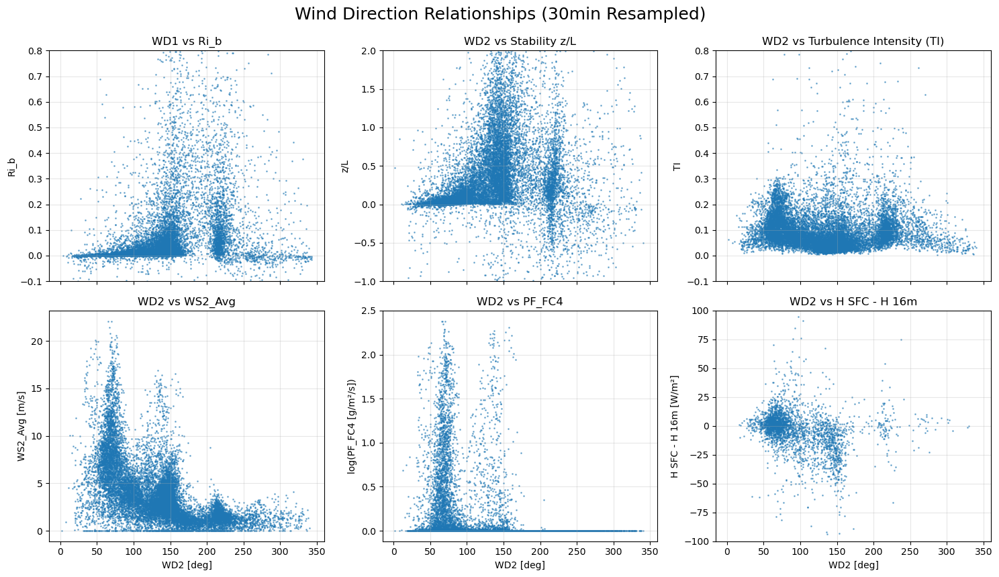

In [ ]:
"""Plots for wind direction relationships with various variables"""
fig, axes = plt.subplots(2, 3, figsize=(15, 9), sharex=True)
axes = axes.flatten()

# 1. WD1 vs Ri_b_surf
axes[0].scatter(
    resample_with_threshold(slowdata_cleaned['WD1'], '30min'),
    resample_with_threshold(Ri_b_surf, '30min'),
    s=1, alpha=0.5
)
axes[0].set_ylim(-0.1, 0.8)
# axes[0].set_xlabel('WD1 [deg]')
axes[0].set_ylabel('Ri_b')
axes[0].set_title('WD1 vs Ri_b')
axes[0].grid(True, alpha=0.3)

# 2. WD2 vs (z-d)/L
axes[1].scatter(
    resample_with_threshold(slowdata_cleaned['WD2'], '30min')[start:end],
    resample_with_threshold(fluxes_SFC['(z-d)/L'], '30min')[start:end],
    s=1, alpha=0.5
)
axes[1].set_ylim(-1, 2)
# axes[1].set_xlabel('WD2 [deg]')
axes[1].set_ylabel('z/L')
axes[1].set_title('WD2 vs Stability z/L')
axes[1].grid(True, alpha=0.3)

# 3. WD2 vs TI
axes[2].scatter(
    resample_with_threshold(slowdata_cleaned['WD2'], '30min')[start:end],
    resample_with_threshold(fluxes_SFC['TI'], '30min')[start:end],
    s=1, alpha=0.5
)
axes[2].set_ylim(-0.1, 0.8)
# axes[2].set_xlabel('WD2 [deg]')
axes[2].set_ylabel('TI')
axes[2].set_title('WD2 vs Turbulence Intensity (TI)')
axes[2].grid(True, alpha=0.3)

# 4. WD2 vs WS2_Avg
axes[3].scatter(
    resample_with_threshold(slowdata_cleaned['WD2'], '30min')[start:end],
    resample_with_threshold(slowdata_cleaned['WS2_Avg'], '30min')[start:end],
    s=1, alpha=0.5
)
axes[3].set_xlabel('WD2 [deg]')
axes[3].set_ylabel('WS2_Avg [m/s]')
axes[3].set_title('WD2 vs WS2_Avg')
axes[3].grid(True, alpha=0.3)

# 5. WD2 vs PF_FC4
axes[4].scatter(
    resample_with_threshold(slowdata_cleaned['WD2'], '30min')[start:end],
    np.log10(1+resample_with_threshold(slowdata_cleaned['PF_FC4'], '30min')[start:end]),
    s=1, alpha=0.5
)
axes[4].set_xlabel('WD2 [deg]')
axes[4].set_ylabel('log(PF_FC4 [g/m²/s])')
axes[4].set_title('WD2 vs PF_FC4')
axes[4].grid(True, alpha=0.3)

# 6. WD2 vs H_16m - H_SFC
axes[5].scatter(
    resample_with_threshold(slowdata_cleaned['WD2'], '30min')[start:end],
    resample_with_threshold(fluxes_SFC_synced['H'], '30min')[start:end] - resample_with_threshold(fluxes_16m_synced['H'], '30min')[start:end],
    s=1, alpha=0.5
)
axes[5].set_xlabel('WD2 [deg]')
axes[5].set_ylabel('H SFC - H 16m [W/m²]')
axes[5].set_title('WD2 vs H SFC - H 16m')
axes[5].grid(True, alpha=0.3)
axes[5].set_ylim(-100, 100)

plt.suptitle('Wind Direction Relationships (30min Resampled)', fontsize=18, y=0.95)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(save_path+'/9_wdir_vars.png', bbox_inches='tight', dpi=300)
plt.show()

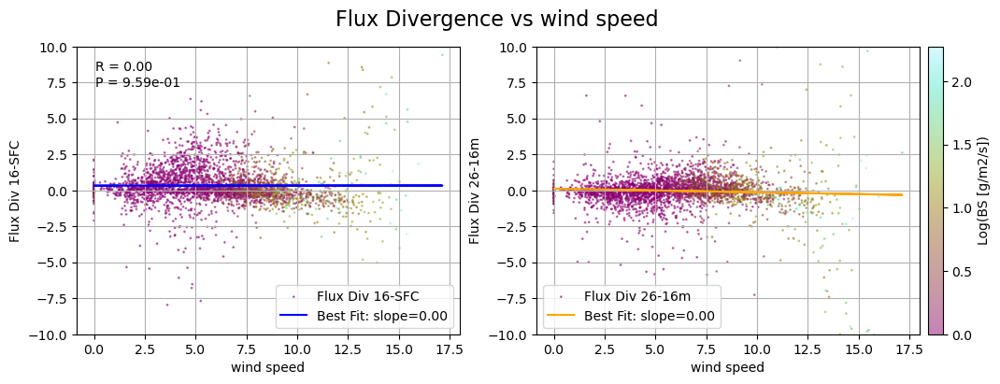

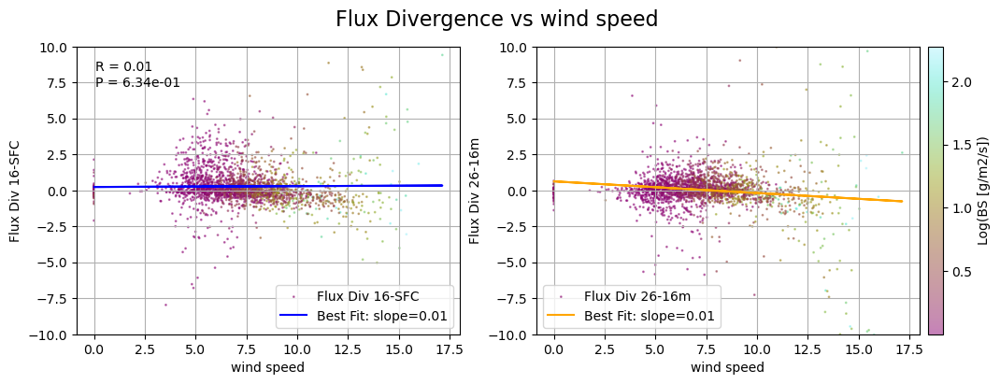

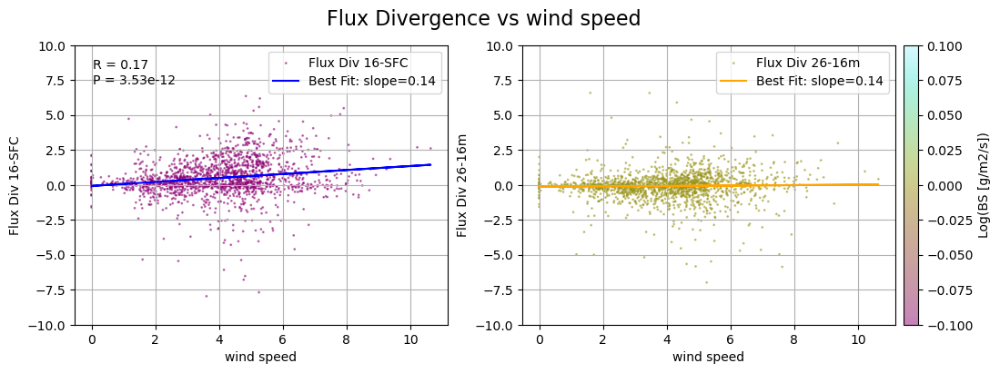

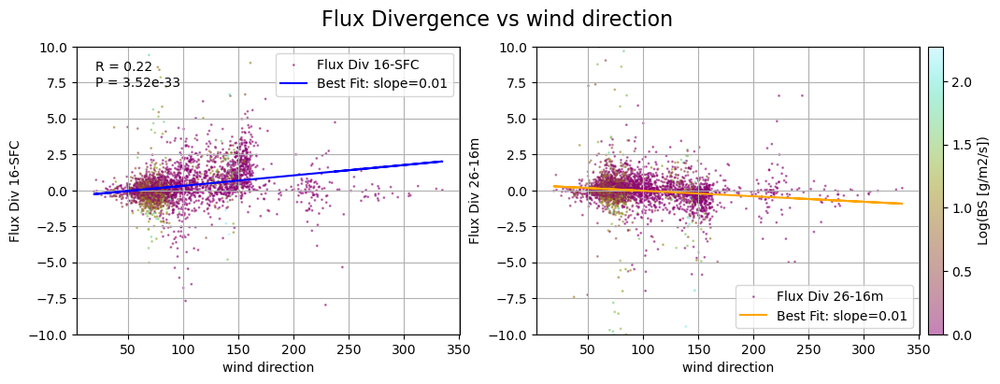

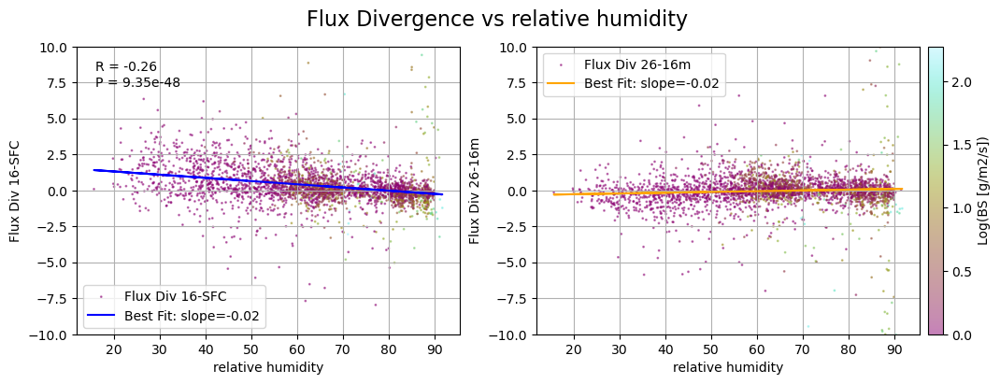

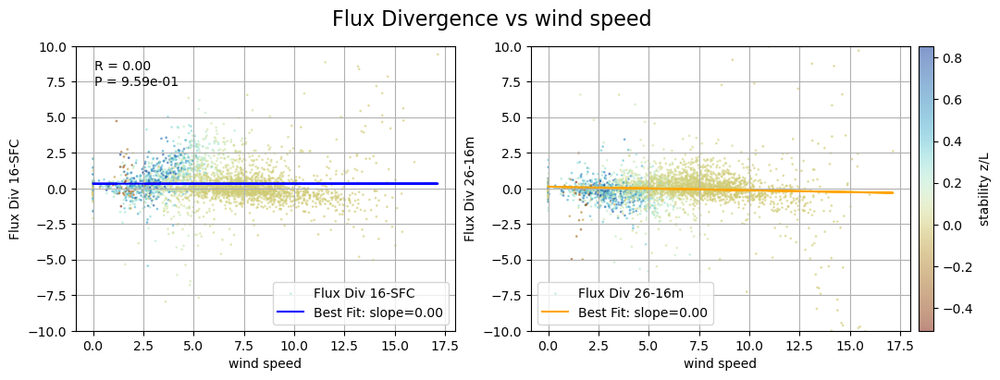

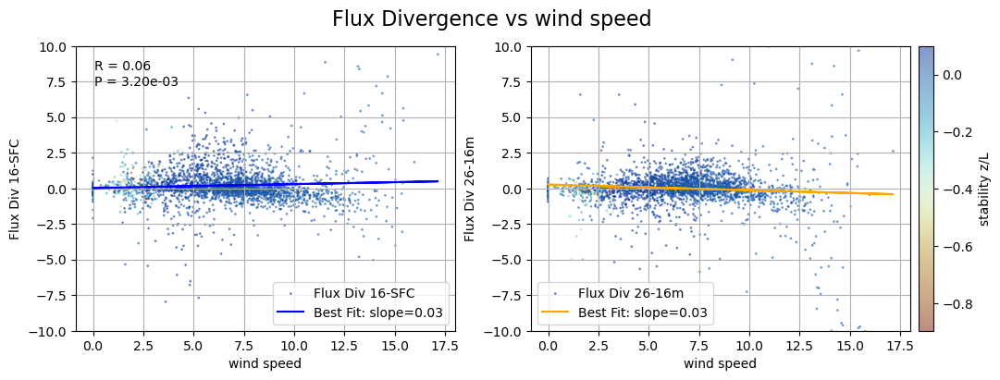

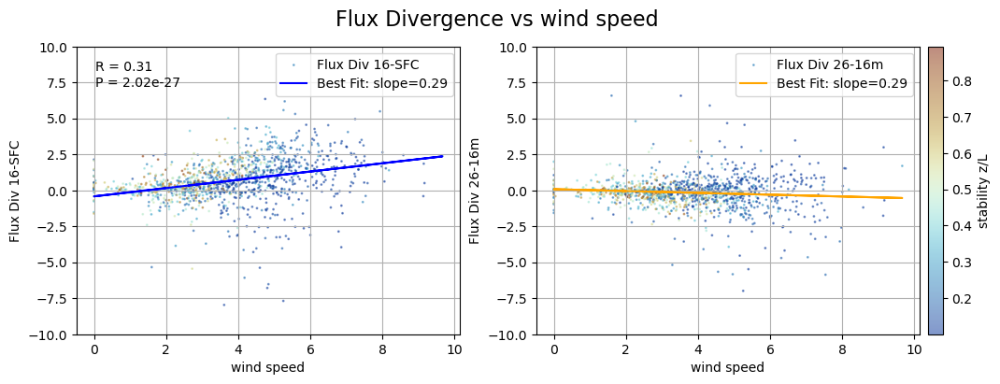

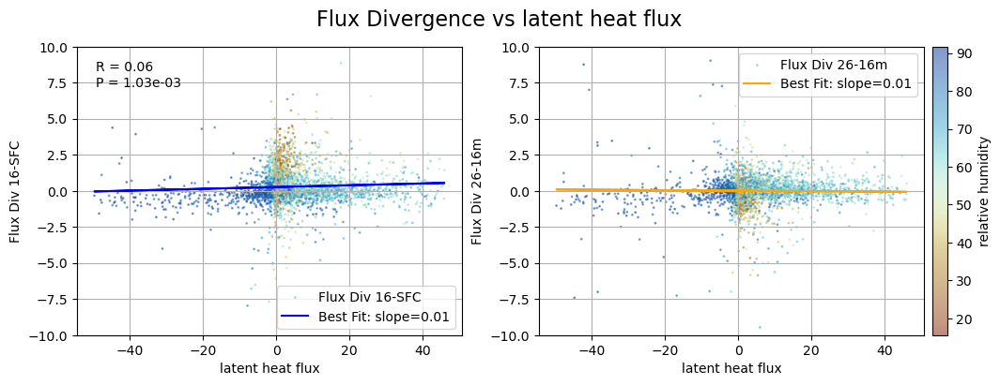

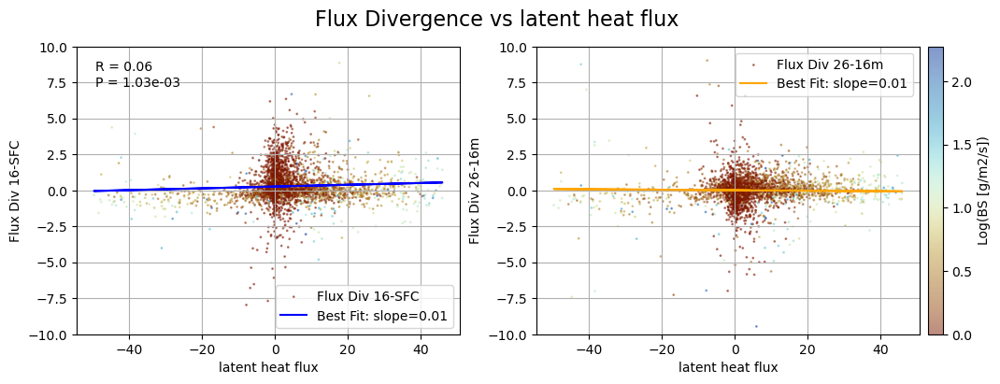

In [ ]:
"""PLOTS FOR FLUX DIVERGENCE AGAINST VARIABLES"""
def plot_flux_div(ws_column, fluxes_16m, fluxes_SFC, fluxes_26m, start, end, label, ylim=(-8, 8), color_column='blue', color_column_name='Log(BS [g/m2/s])', log=True, filter_func=None, cmap=cm.hawaii):
    """
    Plots scatter plots and lines of best fit for flux divergence against a given variable.

    Parameters:
        ws_column (pd.Series): The column to use as the x-axis variable.
        fluxes_16m (pd.DataFrame): Fluxes at 16m height.
        fluxes_SFC (pd.DataFrame): Fluxes at surface.
        fluxes_26m (pd.DataFrame): Fluxes at 26m height.
        start (str): Start datetime for slicing.
        end (str): End datetime for slicing.
        label (str): Label for the x-axis variable.
        ylim (tuple): Limits for the y-axis.
        filter_func (function, optional): Function to filter the x-axis variable.
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharex=True)

    flux_div_1 = (fluxes_16m['H'][start:end] - fluxes_SFC['H'][start:end]) / 14
    flux_div_2 = (fluxes_26m['H'][start:end] - fluxes_16m['H'][start:end]) / 10
    ws = resample_with_threshold(ws_column, '30min', True, '30min', 80)[start:end]
    color_column = resample_with_threshold(color_column, '30min', True,'30min', 80)[start:end]
    if filter_func:
        ws = ws.where(filter_func)
    
    # Drop rows with NaN values to ensure all variables have the same length
    valid_data = pd.concat([ws, flux_div_1, flux_div_2, color_column], axis=1).dropna()
    ws = valid_data.iloc[:, 0]
    flux_div_1 = valid_data.iloc[:, 1]
    flux_div_2 = valid_data.iloc[:, 2]
    color_column = valid_data.iloc[:, 3]

    # Plot for flux_div_1
    if log:
        scatter_1 = axes[0].scatter(ws, flux_div_1, s=1, alpha=0.5, label='Flux Div 16-SFC', c=np.log1p(color_column), cmap=cmap)
    else:   
        scatter_1 = axes[0].scatter(ws, flux_div_1, s=1, alpha=0.5, label='Flux Div 16-SFC', c=color_column, cmap=cmap)
    coeffs_1 = np.polyfit(ws, flux_div_1, 1)
    line_1 = np.polyval(coeffs_1, ws)

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(ws, flux_div_1)
    # Generate the line of best fit
    line_1 = slope * ws + intercept
    # Plot the scatter plot and the line of best fit
    axes[0].plot(ws, line_1, color='blue', label=f'Best Fit: slope={slope:.2f}')
    # Add R-squared and p-value to the plot
    # axes[0].text(0.05, 0.95, f'R² = {r_value**2:.2f}\nP = {p_value:.2e}', transform=axes[0].transAxes, fontsize=10, verticalalignment='top')
    axes[0].text(0.05, 0.95, f'R = {r_value:.2f}\nP = {p_value:.2e}', transform=axes[0].transAxes, fontsize=10, verticalalignment='top')

    # axes[0].plot(ws, line_1, color='blue', label='Best Fit Flux Div 16-SFC')
    axes[0].set_ylim(ylim)
    axes[0].set_ylabel('Flux Div 16-SFC')
    axes[0].legend()
    axes[0].grid(True)

    # Plot for flux_div_2
    if log:
        scatter_2 = axes[1].scatter(ws, flux_div_2, s=1, alpha=0.5, label='Flux Div 26-16m', c=np.log10(1+color_column), cmap=cmap)
    else:
        scatter_2 = axes[1].scatter(ws, flux_div_2, s=1, alpha=0.5, label='Flux Div 26-16m', c=color_column, cmap=cmap)
    coeffs_2 = np.polyfit(ws, flux_div_2, 1)
    line_2 = np.polyval(coeffs_2, ws)
    axes[1].plot(ws, line_2, color='orange', label=f'Best Fit: slope={slope:.2f}')
    axes[1].set_ylim(ylim)
    axes[0].set_xlabel(label)
    axes[1].set_xlabel(label)
    axes[1].set_ylabel('Flux Div 26-16m')
    axes[1].legend()
    axes[1].grid(True)

    # Add a colorbar
    cbar = fig.colorbar(scatter_2, ax=axes, orientation='vertical', fraction=0.02, pad=0.01)
    cbar.set_label(color_column_name)

    fig.suptitle(f'Flux Divergence vs {label}', fontsize=16)
    # plt.tight_layout()
    # plt.show()

start = '2024-01-01 00:00'
end = '2024-12-01 00:00'
color_column_name='Log(BS [g/m2/s])'

ws_column = slowdata_cleaned['WS2_Avg']
color_column = slowdata_cleaned['PF_FC4']
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind speed', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=True, filter_func=None)
plt.savefig(save_path+'1_wind_speed_flux_div.png', bbox_inches='tight', dpi=300)
ws_column = slowdata_cleaned['WS2_Avg'].where(slowdata_cleaned['PF_FC4'] > 0.00001)
color_column = slowdata_cleaned['PF_FC4'].where(slowdata_cleaned['PF_FC4'] > 0.00001)
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind speed', ylim=(-10,10 ),color_column=color_column, color_column_name=color_column_name, log=True, filter_func=None)
plt.savefig(save_path+'2_wind_speed_flux_div.png', bbox_inches='tight', dpi=300)

ws_column = slowdata_cleaned['WS2_Avg'].where(slowdata_cleaned['PF_FC4'] < 0.00001)
color_column = slowdata_cleaned['PF_FC4'].where(slowdata_cleaned['PF_FC4'] < 0.00001)
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind speed', ylim=(-10,10 ),color_column=color_column, color_column_name=color_column_name, log=True, filter_func=None)
plt.savefig(save_path+'3_wind_speed_flux_div.png', bbox_inches='tight', dpi=300)
ws_column = slowdata_cleaned['WD1']
color_column = slowdata_cleaned['PF_FC4']
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind direction', ylim=(-10,10 ),color_column=color_column, color_column_name=color_column_name, log=True, filter_func=None)
plt.savefig(save_path+'4_wind_dir_flux_div.png', bbox_inches='tight', dpi=300)
ws_column = fluxes_SFC['u*']
ws_column = slowdata_cleaned['RH']
color_column = slowdata_cleaned['WS1_Avg']
color_column = slowdata_cleaned['PF_FC4']
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'relative humidity', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=True, filter_func=None)
plt.savefig(save_path+'5_rh_flux_div.png', bbox_inches='tight', dpi=300)

# ws_column = fluxes_SFC['(z-d)/L'].where(lambda x: (x < 1) & (x > -1))
# color_column = slowdata_cleaned['WS1_Avg']
# color_column = slowdata_cleaned['PF_FC4']
# plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wd', ylim=(-10,10 ), color_column=color_column, log=True, filter_func=lambda x: (x < 1) & (x > -1))

ws_column =slowdata_cleaned['WS2_Avg']
color_column = fluxes_SFC['(z-d)/L'].where(lambda x: (x < 1) & (x > -1))
color_column_name='stability z/L'
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind speed', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=False, filter_func=None, cmap=cm.roma)
plt.savefig(save_path+'6_stab_flux_div.png', bbox_inches='tight', dpi=300)

ws_column =slowdata_cleaned['WS2_Avg']
color_column = fluxes_SFC['(z-d)/L'].where(lambda x: (x < 0.1) & (x > -1))
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind speed', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=False, filter_func=None, cmap=cm.roma)
plt.savefig(save_path+'7_stab_flux_div.png', bbox_inches='tight', dpi=300)

ws_column =slowdata_cleaned['WS2_Avg']
color_column = fluxes_SFC['(z-d)/L'].where(lambda x: (x < 1) & (x > 0.1))
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'wind speed', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=False, filter_func=None, cmap=cm.roma_r)
plt.savefig(save_path+'8_stab_flux_div.png', bbox_inches='tight', dpi=300)

color_column =slowdata_cleaned['RH']
color_column_name='relative humidity'
ws_column = fluxes_SFC['LE'].where(lambda x: (x < 50) & (x > -50))
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'latent heat flux', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=False, filter_func=None, cmap=cm.roma)

color_column = slowdata_cleaned['PF_FC4']
color_column_name='Log(BS [g/m2/s])'
ws_column = fluxes_SFC['LE'].where(lambda x: (x < 50) & (x > -50))
plot_flux_div(ws_column, fluxes_16m_synced, fluxes_SFC_synced, fluxes_26m_synced, start, end, 'latent heat flux', ylim=(-10,10 ), color_column=color_column, color_column_name=color_column_name, log=True, filter_func=None, cmap=cm.roma)


Text(0.5, 1.0, 'LE vs Log(1 + BS)')

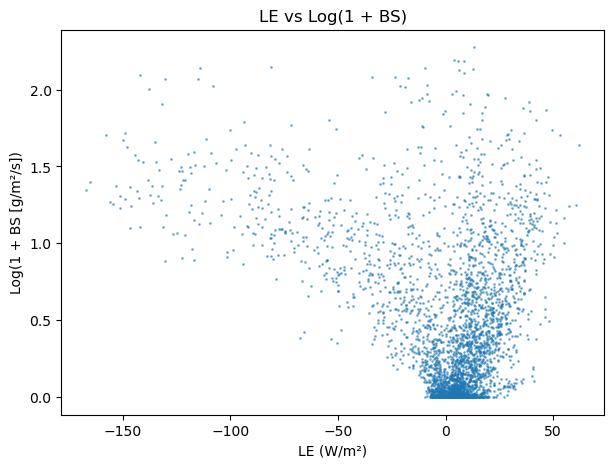

In [ ]:
plt.figure(figsize=(7, 5))
plt.scatter(
    resample_with_threshold(fluxes_SFC['LE'][start:end], '30min'),
    np.log10(1+resample_with_threshold(slowdata_cleaned['PF_FC4'][start:end], '30min')),
    s=1, alpha=0.5
)
plt.xlabel('LE (W/m²)')
plt.ylabel('Log(1 + BS [g/m²/s])')
plt.title('LE vs Log(1 + BS)')



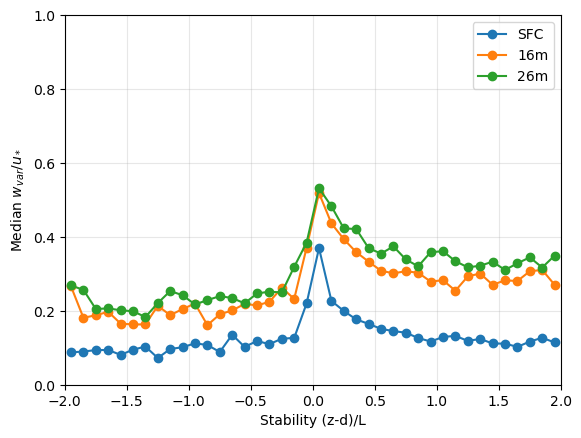

In [182]:
bins = np.arange(-2, 2.1, 0.1)
bin_centers = (bins[:-1] + bins[1:]) / 2

def median_profile(df, label):
    x = df['(z-d)/L']
    y = df['w_var'] / df['u*']
    medians = []
    for left, right in zip(bins[:-1], bins[1:]):
        mask = (x >= left) & (x < right)
        medians.append(np.nanmedian(y[mask]))
    plt.plot(bin_centers, medians, marker='o', label=label)

median_profile(fluxes_SFC_synced, 'SFC')
median_profile(fluxes_16m_synced, '16m')
median_profile(fluxes_26m_synced, '26m')
plt.xlabel('Stability (z-d)/L')
plt.ylabel('Median $w_{var}/u_*$')
plt.legend()
plt.xlim(-2, 2)
plt.ylim(0, 1)
plt.grid(True, alpha=0.3)
plt.show()

/tmp/ipykernel_853533/816218850.py:15: RuntimeWarning: All-NaN slice encountered
  medians.append(np.nanmedian(y[mask]))
/home/engbers/miniconda3/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


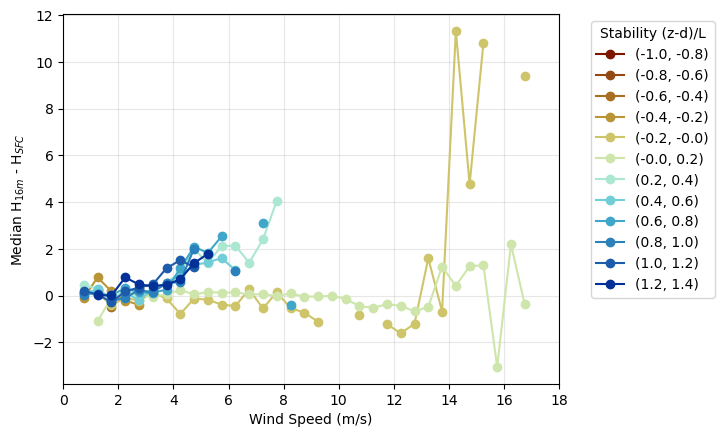

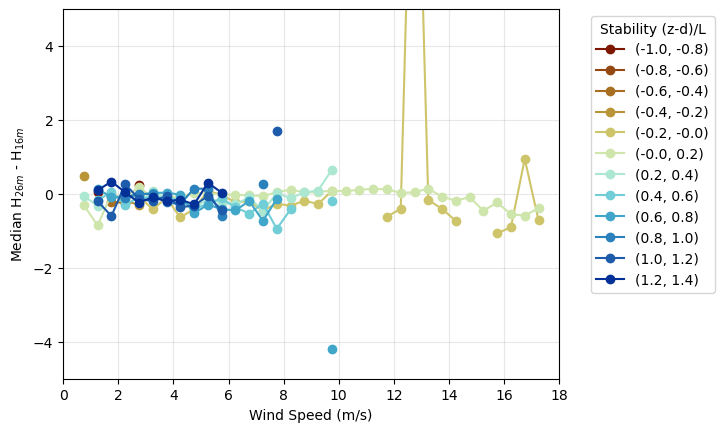

In [ ]:
"""PLOTS FOR MEDIAN FLUX DIVEGRENCE PER WIND SPEED AND STABILITY BINS"""
bins = np.arange(0, 18, 0.5)
bin_centers = (bins[:-1] + bins[1:]) / 2
stability_bins = np.arange(-1, 1.5, 0.2)
stability_labels = [f"{stability_bins[i]:.1f} to {stability_bins[i+1]:.1f}" for i in range(len(stability_bins)-1)]

cmap = cm.roma
colors = cmap(np.linspace(0, 1, len(stability_labels)))

def median_profile_stability(df, df2, label, stability_mask, color):
    y = (df2['H'] - df['H'])/14
    x = df['wind_speed']
    medians = []
    for left, right in zip(bins[:-1], bins[1:]):
        mask = (x >= left) & (x < right) & stability_mask
        medians.append(np.nanmedian(y[mask]))
    plt.plot(bin_centers, medians, marker='o', label=label, color=color)

for i, (left, right) in enumerate(zip(stability_bins[:-1], stability_bins[1:])):
    stability_mask = (fluxes_SFC_synced['(z-d)/L'] >= left) & (fluxes_SFC_synced['(z-d)/L'] < right)
    median_profile_stability(
        fluxes_SFC_synced, fluxes_16m_synced, f"({left:.1f}, {right:.1f})", stability_mask, colors[i]
    )

plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Median H$_{16m}$ - H$_{SFC}$')
plt.legend(title='Stability (z-d)/L', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.xlim(0, 18)
plt.savefig(save_path+'10_wind_speed_stability.png', bbox_inches='tight', dpi=300)
plt.show()
plt.figure()
for i, (left, right) in enumerate(zip(stability_bins[:-1], stability_bins[1:])):
    stability_mask = (fluxes_SFC_synced['(z-d)/L'] >= left) & (fluxes_SFC_synced['(z-d)/L'] < right)
    median_profile_stability(
        fluxes_16m_synced, fluxes_26m_synced, f"({left:.1f}, {right:.1f})", stability_mask, colors[i]
    )

plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Median H$_{26m}$ - H$_{16m}$')
plt.legend(title='Stability (z-d)/L', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.xlim(0, 18)
plt.ylim(-5,5)
plt.savefig(save_path+'10_wind_speed_stability2.png', bbox_inches='tight', dpi=300)

plt.show()

Text(0, 0.5, 'WS2_Avg (m/s)')

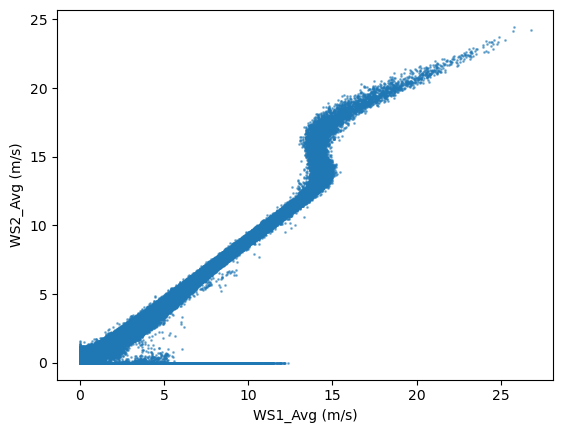

In [ ]:
plt.figure()
plt.scatter(slowdata_cleaned['WS1_Avg'], slowdata_cleaned['WS2_Avg'], s=1, alpha=0.5)
plt.xlabel('WS1_Avg (m/s)')
plt.ylabel('WS2_Avg (m/s)')


(<Figure size 1300x1800 with 10 Axes>,
 array([<Axes: ylabel='Temperature [oC]'>, <Axes: ylabel='RH wrt ice [%]'>,
        <Axes: ylabel='Wind Direction'>,
        <Axes: ylabel='Wind Speed [ms-1]'>,
        <Axes: ylabel='Net Radiation [Wm-2]'>, <Axes: ylabel='HS_Cor [m]'>,
        <Axes: ylabel='Mass flux [g/m2/s]'>, <Axes: ylabel='H [Wm-2]'>,
        <Axes: ylabel='LE [Wm-2]'>], dtype=object))

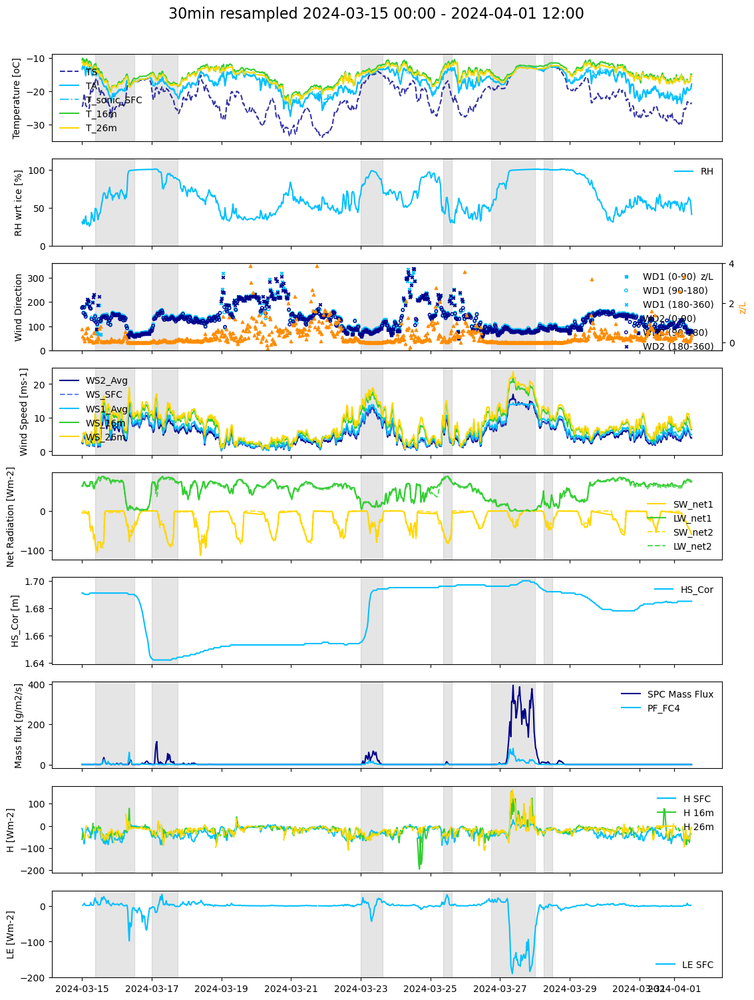

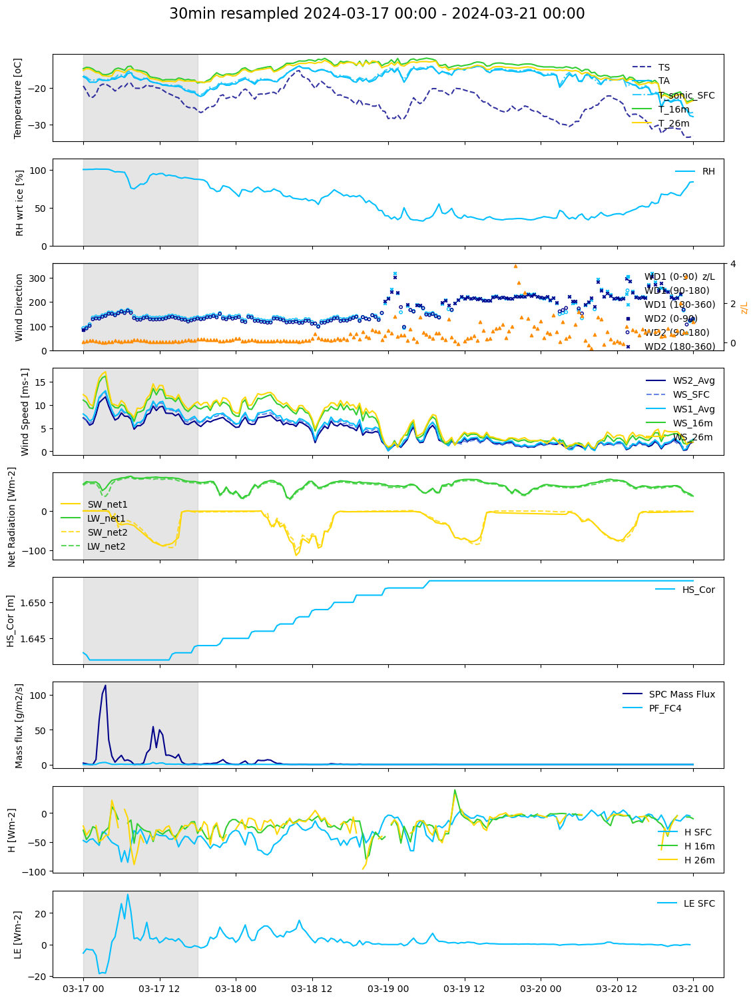

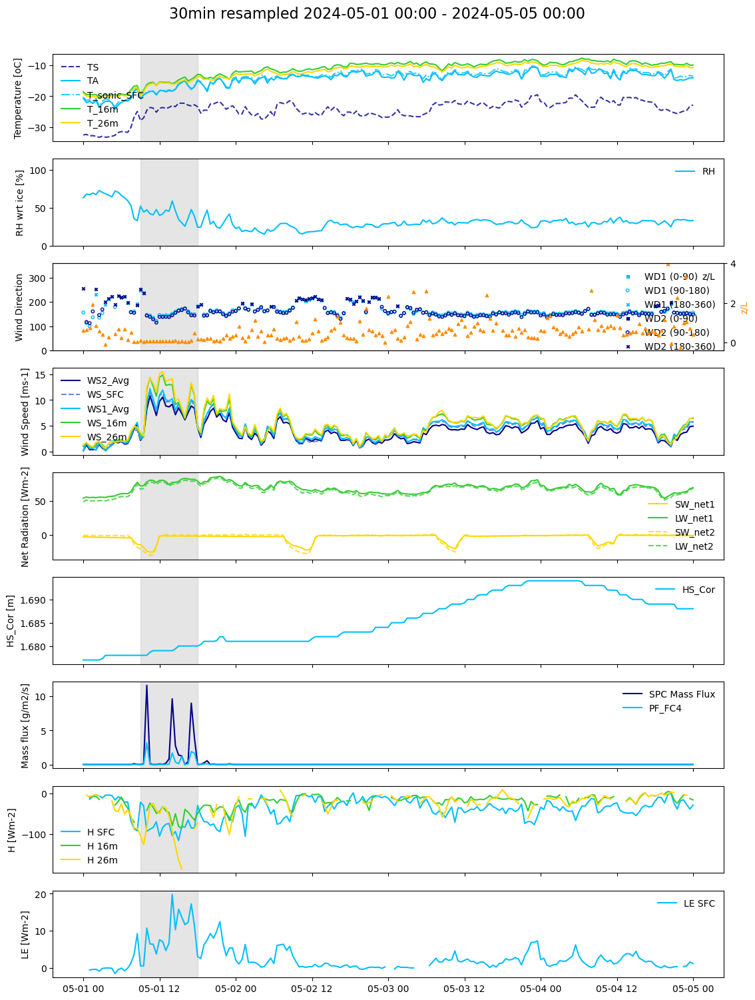

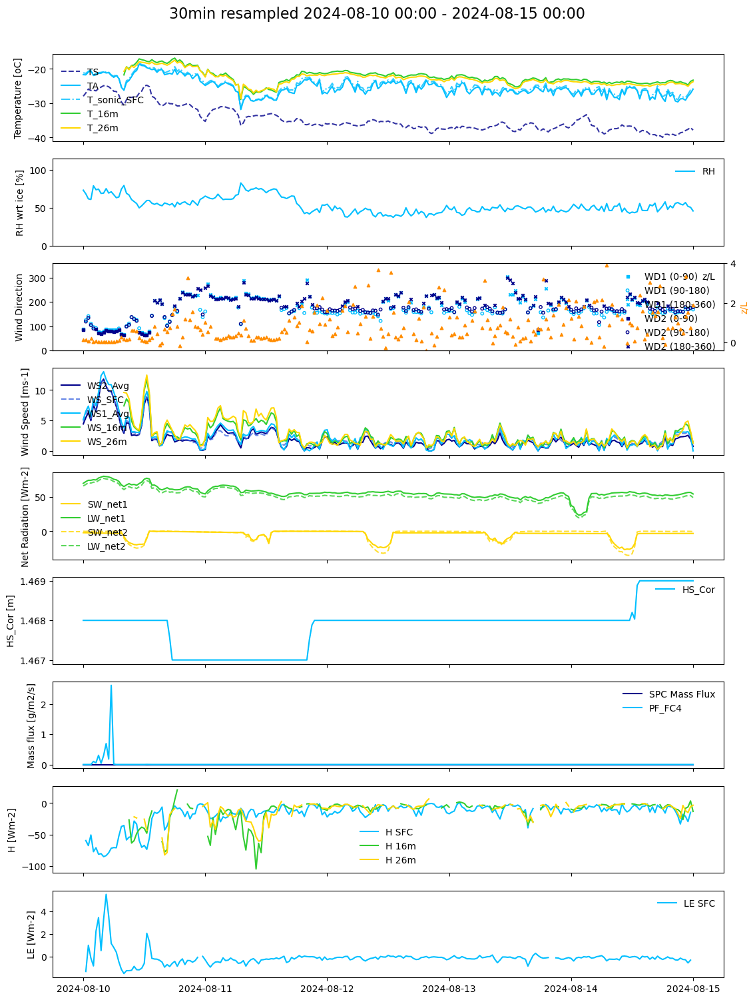

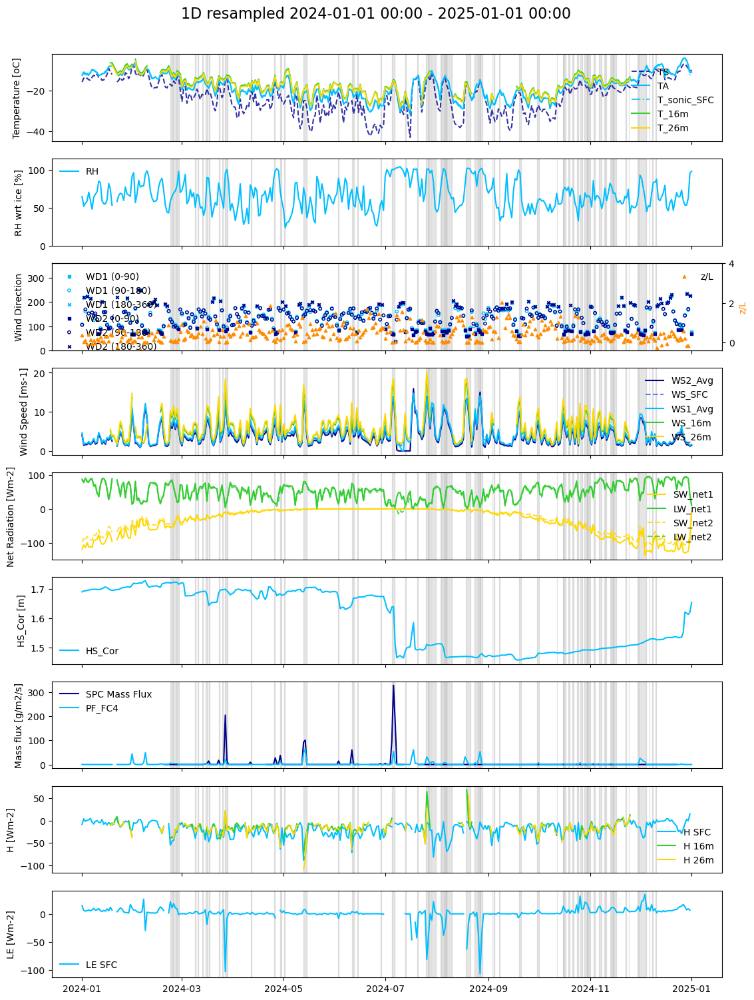

In [ ]:
""""PLOT TIMESERIES AND DEFINE START AND END, GREY BARS GIVE BS PERIODS >3h"""
# """PLOT SLOWDATA AND FLUXES"""
start='2024-03-15 00:00'
end='2024-04-01 12:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end, SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-03-17 00:00'
end='2024-03-21 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-05-01 00:00'
end='2024-05-05 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-08-10 00:00'
end='2024-08-15 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='30min', interpolate=True, interp_time='30min')

start='2024-01-01 00:00'
end='2025-01-01 00:00'
plot_SFC_slowdata_and_fluxes(slowdata_cleaned, fluxes_SFC, fluxes_16m, fluxes_26m, sensor, start, end,  SPC=SPC, resample_time='1D', interpolate=True, interp_time='30min')

In [18]:
def find_consecutive_wd1_periods(slowdata, wd1_min, wd1_max, min_duration='1h'):
    """
    Finds consecutive periods where slowdata['WD1'] is within [wd1_min, wd1_max] degrees.

    Parameters:
        slowdata (pd.DataFrame): DataFrame containing 'WD1' column.
        wd1_min (float): Minimum wind direction (inclusive).
        wd1_max (float): Maximum wind direction (inclusive).
        min_duration (str): Minimum duration for a valid period (e.g., '1H').

    Returns:
        list: List of (start, end) tuples for each valid period.
    """
    mask = (slowdata['WD1'] >= wd1_min) & (slowdata['WD1'] <= wd1_max)
    mask = mask.astype(int)
    diff = mask.diff().fillna(0)
    starts = slowdata.index[diff == 1]
    ends = slowdata.index[diff == -1]

    # Handle if period starts at the beginning
    if mask.iloc[0]:
        starts = starts.insert(0, slowdata.index[0])
    # Handle if period ends at the end
    if len(ends) < len(starts):
        ends = ends.append(pd.Index([slowdata.index[-1]]))

    periods = []
    for s, e in zip(starts, ends):
        if (e - s) >= pd.Timedelta(min_duration):
            periods.append((s, e))
    return periods

# Example usage:
wd1_45_90_periods = find_consecutive_wd1_periods(slowdata_cleaned, 45,100, '12h')
import pickle

# Save the list to a file
with open('wd1_45_90_periods.pkl', 'wb') as f:
    pickle.dump(wd1_45_90_periods, f)
wd1_90_180_periods = find_consecutive_wd1_periods(slowdata_cleaned, 110, 180, '12h')

# Save the list to a file
with open('wd1_90_180_periods.pkl', 'wb') as f:
    pickle.dump(wd1_90_180_periods, f)
wd1_45_90_periods

[(Timestamp('2024-01-30 16:18:00'), Timestamp('2024-02-01 02:44:00')),
 (Timestamp('2024-02-17 05:35:00'), Timestamp('2024-02-17 20:30:00')),
 (Timestamp('2024-02-17 23:34:00'), Timestamp('2024-02-19 01:16:00')),
 (Timestamp('2024-02-27 17:51:00'), Timestamp('2024-02-28 09:41:00')),
 (Timestamp('2024-03-16 08:03:00'), Timestamp('2024-03-17 00:18:00')),
 (Timestamp('2024-05-08 03:29:00'), Timestamp('2024-05-08 18:12:00')),
 (Timestamp('2024-06-14 03:19:00'), Timestamp('2024-06-14 16:31:00')),
 (Timestamp('2024-07-04 23:41:00'), Timestamp('2024-07-06 22:22:00')),
 (Timestamp('2024-07-17 07:59:00'), Timestamp('2024-07-18 17:39:00')),
 (Timestamp('2024-07-20 05:40:00'), Timestamp('2024-07-20 20:47:00')),
 (Timestamp('2024-07-25 15:02:00'), Timestamp('2024-07-26 14:33:00')),
 (Timestamp('2024-07-26 14:34:00'), Timestamp('2024-07-27 05:55:00')),
 (Timestamp('2024-07-28 13:12:00'), Timestamp('2024-07-30 22:52:00')),
 (Timestamp('2024-08-06 08:01:00'), Timestamp('2024-08-07 20:33:00')),
 (Time

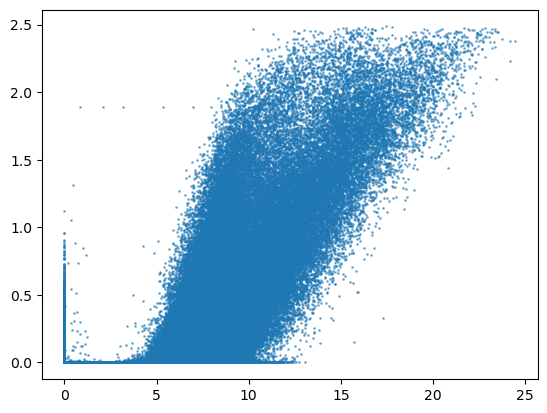

In [ ]:
"""BS PER WIND SPEED"""
plt.scatter(slowdata_cleaned['WS2_Avg'], np.log10(1+slowdata_cleaned['PF_FC4']), s=1, alpha=0.5)

In [ ]:

def find_consecutive_stability_periods(fluxes_SFC, lower, upper, min_duration='1h'):
    """
    Finds consecutive periods where fluxes_SFC['(z-d)/L'] is within [lower, upper].

    Parameters:
        fluxes_SFC (pd.DataFrame): DataFrame containing '(z-d)/L' column.
        lower (float): Lower bound (inclusive).
        upper (float): Upper bound (inclusive).
        min_duration (str): Minimum duration for a valid period (e.g., '1H').

    Returns:
        list: List of (start, end) tuples for each valid period.
    """
    mask = (fluxes_SFC['(z-d)/L'] >= lower) & (fluxes_SFC['(z-d)/L'] <= upper)
    mask = mask.astype(int)
    diff = mask.diff().fillna(0)
    starts = fluxes_SFC.index[diff == 1]
    ends = fluxes_SFC.index[diff == -1]

    # Handle if period starts at the beginning
    if mask.iloc[0]:
        starts = starts.insert(0, fluxes_SFC.index[0])
    # Handle if period ends at the end
    if len(ends) < len(starts):
        ends = ends.append(pd.Index([fluxes_SFC.index[-1]]))

    periods = []
    for s, e in zip(starts, ends):
        if (e - s) >= pd.Timedelta(min_duration):
            periods.append((s, e))
    return periods

# Example usage:
stability_0_02_periods = find_consecutive_stability_periods(fluxes_SFC_synced, -0.1, 0.1, min_duration='12h')
stability_02_10_periods = find_consecutive_stability_periods(fluxes_SFC_synced, 0.15, 10, min_duration='12h')
# Save the periods as pickle files
with open('stability_0_02_periods.pkl', 'wb') as f:
    pickle.dump(stability_0_02_periods, f)

with open('stability_02_10_periods.pkl', 'wb') as f:
    pickle.dump(stability_02_10_periods, f)

stability_0_02_periods
stability_02_10_periods

[(Timestamp('2024-03-03 18:00:00'), Timestamp('2024-03-04 12:00:00')),
 (Timestamp('2024-03-08 15:00:00'), Timestamp('2024-03-09 03:00:00')),
 (Timestamp('2024-03-21 01:30:00'), Timestamp('2024-03-21 14:00:00')),
 (Timestamp('2024-03-21 22:30:00'), Timestamp('2024-03-22 11:30:00')),
 (Timestamp('2024-03-29 21:30:00'), Timestamp('2024-03-30 14:00:00')),
 (Timestamp('2024-04-08 14:30:00'), Timestamp('2024-04-09 07:30:00')),
 (Timestamp('2024-04-09 16:00:00'), Timestamp('2024-04-10 12:00:00')),
 (Timestamp('2024-04-16 08:00:00'), Timestamp('2024-04-17 13:00:00')),
 (Timestamp('2024-04-19 02:30:00'), Timestamp('2024-04-20 00:00:00')),
 (Timestamp('2024-04-24 04:00:00'), Timestamp('2024-04-24 19:30:00')),
 (Timestamp('2024-05-04 22:00:00'), Timestamp('2024-05-05 12:30:00')),
 (Timestamp('2024-05-06 03:30:00'), Timestamp('2024-05-06 21:30:00')),
 (Timestamp('2024-05-09 06:00:00'), Timestamp('2024-05-09 23:30:00')),
 (Timestamp('2024-05-19 11:00:00'), Timestamp('2024-05-20 09:30:00')),
 (Time

In [ ]:
wd1_45_90_periods = find_consecutive_wd1_periods(slowdata_cleaned, 45, 100, '12h')
wd1_90_180_periods = find_consecutive_wd1_periods(slowdata_cleaned, 110, 180, '12h')
wd1_45_90_periods
for start, end in wd1_45_90_periods:
    try:
        check_log_profile(slowdata, fluxes_SFC, fluxes_16m_synced, fluxes_26m_synced, start, end, log=False)
        plt.savefig(save_path+f'logprofile_WD_45_90_{start}.png', bbox_inches='tight')
        plt.close()
    except Exception as e:
        print(f"Error for period {start} to {end}: {e}")
for start, end in wd1_90_180_periods:
    try:
        check_log_profile(slowdata, fluxes_SFC, fluxes_16m_synced, fluxes_26m_synced, start, end, log=False)
        plt.savefig(save_path+f'logprofile_WD_90_180_{start}.png', bbox_inches='tight')
        plt.close()
    except Exception as e:
        print(f"Error for period {start} to {end}: {e}")


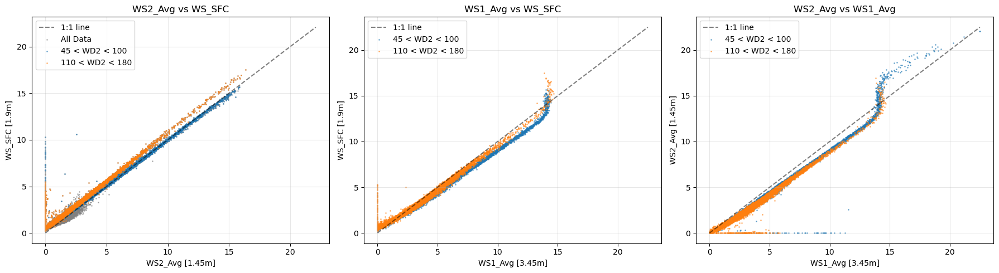

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Apply wind direction masks
ws2 = resample_with_threshold(slowdata_cleaned['WS2_Avg'], '30min')
wsf = resample_with_threshold(fluxes_SFC['wind_speed'], '30min')
wd2 = resample_with_threshold(slowdata_cleaned['WD2'], '30min')
# Align the wind speed series
ws2, wsf = ws2.align(wsf, join='inner')
# Define min and max values for the 1:1 line
min_val = min(ws2.min(), wsf.min())
max_val = max(ws2.max(), wsf.max())
ws2_45_100 = ws2.where((wd2 > 45) & (wd2 < 100))
wsf_45_100 = wsf.where((wd2 > 45) & (wd2 < 100))
ws2_110_180 = ws2.where((wd2 > 110) & (wd2 < 180))
wsf_110_180 = wsf.where((wd2 > 110) & (wd2 < 180))
axes[0].plot([min_val, max_val], [min_val, max_val], 'k--', label='1:1 line', alpha=0.5)
axes[0].scatter(ws2, wsf, s=1, alpha=0.5, label='All Data', color='gray')
axes[0].scatter(ws2_45_100, wsf_45_100, s=1, alpha=0.5, label='45 < WD2 < 100')
axes[0].scatter(ws2_110_180, wsf_110_180, s=1, alpha=0.5, label='110 < WD2 < 180')
axes[0].set_xlabel('WS2_Avg [1.45m]')
axes[0].set_ylabel('WS_SFC [1.9m]')
axes[0].legend()
axes[0].set_title('WS2_Avg vs WS_SFC')

ws2 = resample_with_threshold(slowdata_cleaned['WS1_Avg'], '30min')
wsf = resample_with_threshold(fluxes_SFC['wind_speed'], '30min')
wd2 = resample_with_threshold(slowdata_cleaned['WD1'], '30min')
# Align the wind speed series
ws2, wsf = ws2.align(wsf, join='inner')
# Apply wind direction masks
ws2_45_100 = ws2.where((wd2 > 45) & (wd2 < 100))
wsf_45_100 = wsf.where((wd2 > 45) & (wd2 < 100))
ws2_110_180 = ws2.where((wd2 > 110) & (wd2 < 180))
wsf_110_180 = wsf.where((wd2 > 110) & (wd2 < 180))
# Define min and max values for the 1:1 line
min_val = min(ws2.min(), wsf.min())
max_val = max(ws2.max(), wsf.max())
axes[1].plot([min_val, max_val], [min_val, max_val], 'k--', label='1:1 line', alpha=0.5)
axes[1].scatter(ws2_45_100, wsf_45_100, s=1, alpha=0.5, label='45 < WD2 < 100')
axes[1].scatter(ws2_110_180, wsf_110_180, s=1, alpha=0.5, label='110 < WD2 < 180')
axes[1].set_xlabel('WS1_Avg [3.45m]')
axes[1].set_ylabel('WS_SFC [1.9m]')
axes[1].legend()
axes[1].set_title('WS1_Avg vs WS_SFC')

ws2 = resample_with_threshold(slowdata_cleaned['WS2_Avg'], '30min')
wsf = resample_with_threshold(slowdata_cleaned['WS1_Avg'], '30min')
wd2 = resample_with_threshold(slowdata_cleaned['WD1'], '30min')
# Align the wind speed series
ws2, wsf = ws2.align(wsf, join='inner')
# 1:1 line
min_val = min(ws2.min(), wsf.min())
# Apply wind direction masks
ws2_45_100 = ws2.where((wd2 > 45) & (wd2 < 100))
wsf_45_100 = wsf.where((wd2 > 45) & (wd2 < 100))
ws2_110_180 = ws2.where((wd2 > 110) & (wd2 < 180))
wsf_110_180 = wsf.where((wd2 > 110) & (wd2 < 180))
axes[2].plot([min_val, max_val], [min_val, max_val], 'k--', label='1:1 line', alpha=0.5)
axes[2].scatter(wsf_45_100, ws2_45_100, s=1, alpha=0.5, label='45 < WD2 < 100')
axes[2].scatter(wsf_110_180, ws2_110_180, s=1, alpha=0.5, label='110 < WD2 < 180')
axes[2].set_xlabel('WS1_Avg [3.45m]')
axes[2].set_ylabel('WS2_Avg [1.45m]')
axes[2].legend()
axes[2].set_title('WS2_Avg vs WS1_Avg')

for ax in axes:
    ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(save_path+'12_ws_comparison.png', bbox_inches='tight', dpi=300)
plt.show()

In [ ]:
with open('events.pkl', 'wb') as f:
    pickle.dump(events, f)

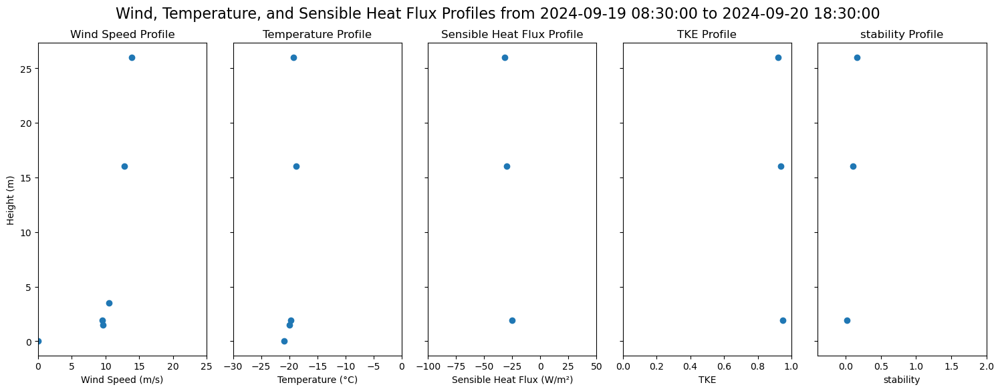

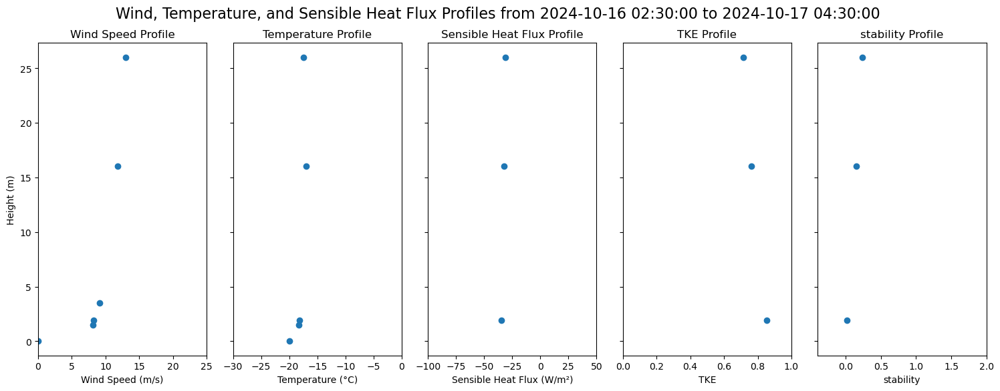

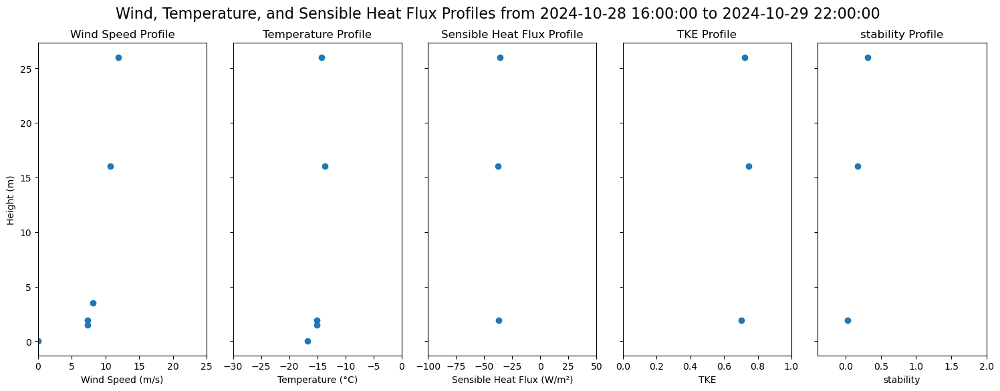

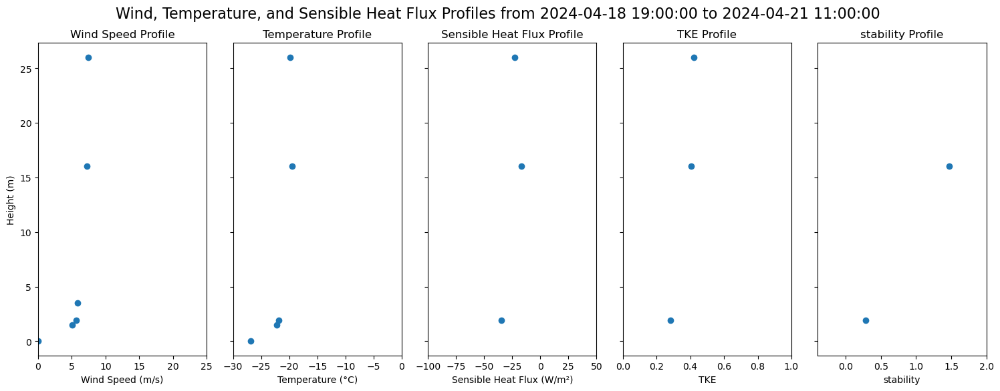

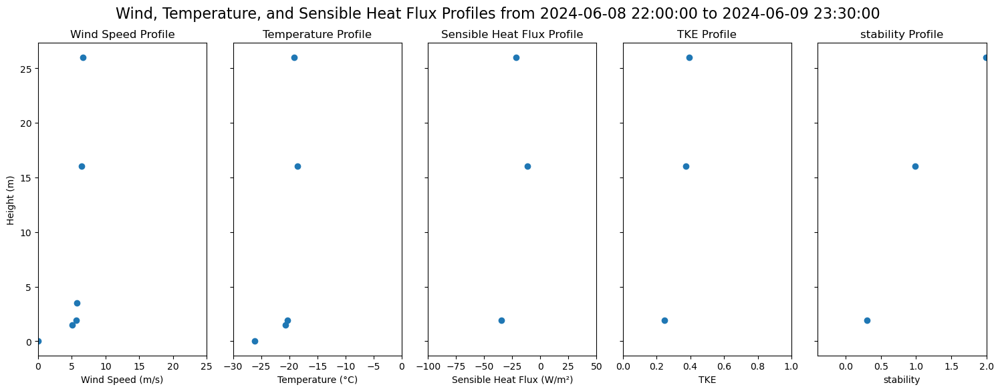

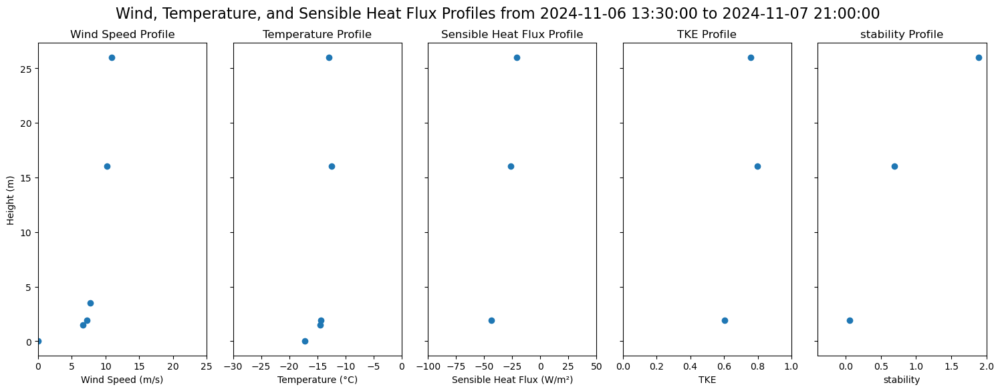

In [ ]:
for start,end in events:
    check_log_profile(slowdata, fluxes_SFC, fluxes_16m_synced, fluxes_26m_synced, start, end, log=False)




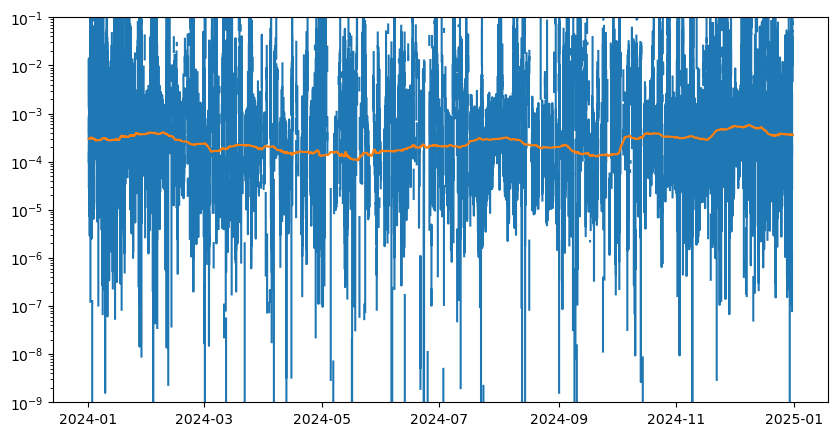

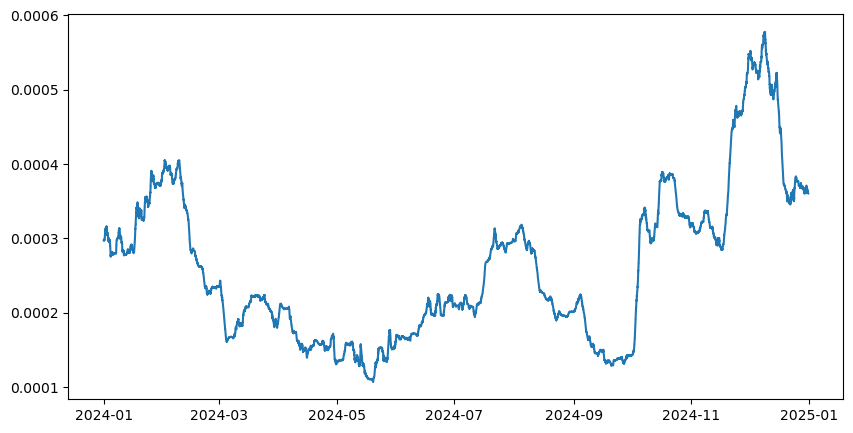

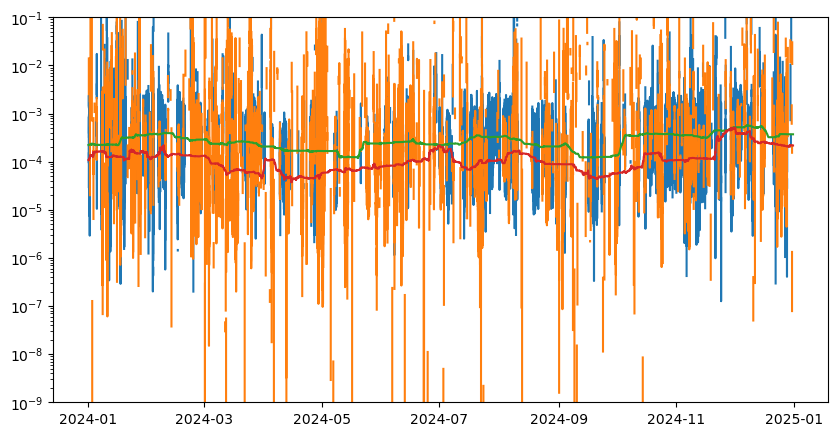

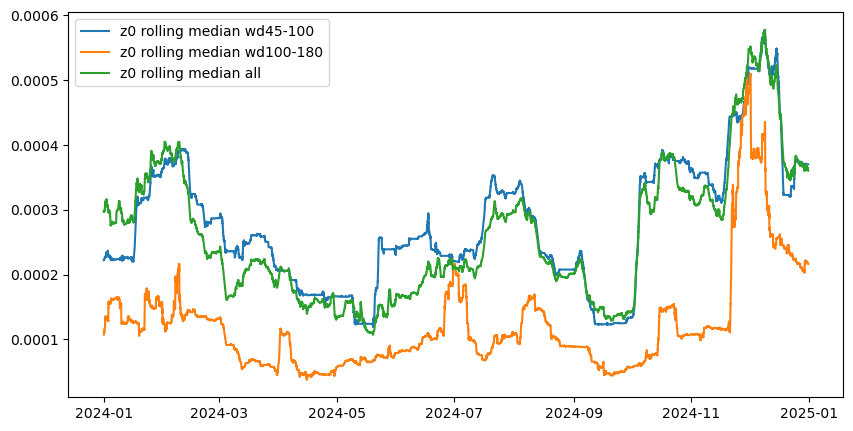

In [ ]:
wd_mask= (resample_with_threshold(slowdata_cleaned['WD1'], '3min') > 45) & (resample_with_threshold(slowdata_cleaned['WD1'], '3min') < 100)
z0wd45, z0rollingwd45=compute_roughness_length(fluxes_SFC.where(wd_mask), fluxes_SFC_qc, 1.9)
z0, z0rolling=compute_roughness_length(fluxes_SFC, fluxes_SFC_qc, 1.9)
plt.figure(figsize=(10, 5))
plt.plot(z0)
plt.plot(z0rolling, label='z0 rolling median')
plt.yscale('log')
plt.ylim(1e-9, 1e-1)
plt.figure(figsize=(10, 5))
plt.plot(z0rolling, label='z0 rolling median')
wd_mask= (resample_with_threshold(slowdata_cleaned['WD1'], '3min') > 100) & (resample_with_threshold(slowdata_cleaned['WD1'], '3min') < 180)
z0wd100, z0rollingwd100=compute_roughness_length(fluxes_SFC.where(wd_mask), fluxes_SFC_qc, 1.9)
plt.figure(figsize=(10, 5))
plt.plot(z0wd45, label='z0 wd 45 rolling median')
plt.plot(z0wd100, label='z0 wd 100 rolling median')
plt.plot(z0rollingwd45, label='z0 rolling median')
plt.plot(z0rollingwd100, label='z0 rolling median')
plt.yscale('log')
plt.ylim(1e-9, 1e-1)
plt.figure(figsize=(10, 5))
plt.plot(z0rollingwd45, label='z0 rolling median wd45-100')
plt.plot(z0rollingwd100, label='z0 rolling median wd100-180')
plt.plot(z0rolling, label='z0 rolling median all')
plt.savefig(save_path+'/15_roughness_lengths_WD.png', dpi=300)
plt.legend()

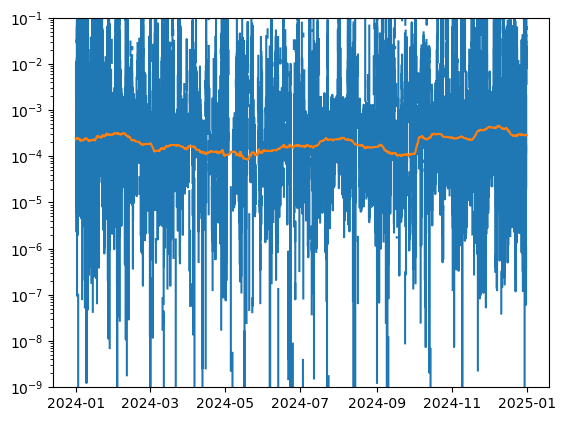

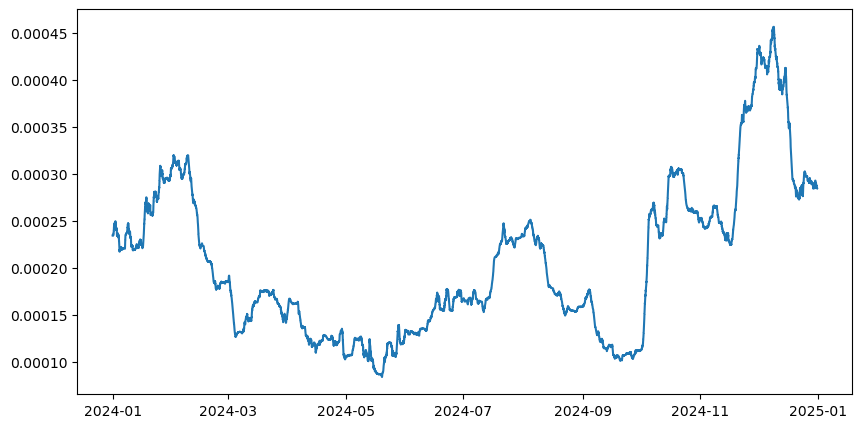

In [13]:
z0, z0rolling=compute_roughness_length(fluxes_SFC, fluxes_SFC_qc, 1.5)
plt.plot(z0)
plt.plot(z0rolling, label='z0 rolling median')
plt.yscale('log')
plt.ylim(1e-9, 1e-1)
plt.figure(figsize=(10, 5))
plt.plot(z0rolling, label='z0 rolling median')

In [ ]:
def rolling_median(data, column_name='HS_Cor', window='1D', max_value=None):
    """
    Function to despike snow height data using a one-day moving median filter.
    
    Parameters:
    - data (pd.DataFrame): The input DataFrame containing snow height data.
    - column_name (str): The name of the column containing snow height data.
    
    Returns:
    - pd.Series: The despiked snow height data.
    """
    if column_name not in data.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")
    
    # Apply a one-day moving median filter
    median_filtered = data[column_name].rolling(window=window, center=True, min_periods=1).median()
    if max_value is not None:
        # Remove values above 2m
        median_filtered[median_filtered > max_value] = np.nan
        # Interpolate NaN values
        median_filtered = median_filtered.interpolate(method='linear', limit_direction='both')
    return median_filtered

In [21]:
import glob
folder='/home/engbers/Documents/PhD/EC_data_convert/SFC/202403/'
fastdata_list = []
units_metadata = {}

for file in sorted(glob.glob(folder + '*.dat')):
    temp_data = pd.read_csv(
        file,
        sep='\t',
        index_col=0,
        header=0,
        low_memory=False,
        na_values=['NaN'])
    temp_data.index = pd.to_datetime(temp_data.index, errors='coerce', format='mixed')
    dropped_row = temp_data.iloc[0]  # Extract the first row as metadata
    temp_data = temp_data.iloc[1:]  # Remove the first row from the data
    units_metadata[file] = dropped_row.to_dict()  # Store metadata in a dictionary
    
    # Convert all columns to numeric
    temp_data = temp_data.apply(pd.to_numeric, errors='coerce')
    
    fastdata_list.append(temp_data)  # Add the cleaned DataFrame to the list

# Concatenate all DataFrames in the list into a single DataFrame
fastdata = pd.concat(fastdata_list, ignore_index=False)

# Print the resulting DataFrame
print(fastdata)

                              Ux       Uy       Uz        Ts  LI_H2Om  LI_Pres
2024-03-01 00:00:00.000  0.48250 -2.40475  0.21900 -20.63008     35.9   1831.0
2024-03-01 00:00:00.100  0.24375 -2.55500  0.21825 -20.75847     36.6   1805.0
2024-03-01 00:00:00.200  0.18450 -2.35725  0.08550 -20.63641     36.4   1834.0
2024-03-01 00:00:00.300  0.45625 -2.39325  0.15050 -20.66336     36.1   1860.0
2024-03-01 00:00:00.400  0.66725 -2.33725  0.10750 -20.62689     36.1   1829.0
...                          ...      ...      ...       ...      ...      ...
2024-03-31 23:59:59.500  1.15900 -3.25900  0.14600 -22.77211     20.6   2065.0
2024-03-31 23:59:59.600  1.34400 -3.01650 -0.00975 -22.53528     20.7   2065.0
2024-03-31 23:59:59.700  1.12675 -2.96000 -0.05600 -22.51001     21.2   2089.0
2024-03-31 23:59:59.800  0.71775 -2.75525 -0.08900 -22.49261     20.9   2091.0
2024-03-31 23:59:59.900  1.11875 -2.67950 -0.04650 -22.50684     21.1   2065.0

[26784000 rows x 6 columns]


In [22]:
"""DOUBLE ROTATE THE DATA TO ALIGN WIND VECTOR WITH X-AXIS"""
fastdata_rot, angles=double_rotation(fastdata)


Double rotation for blocks of 0 days 00:30:00


/home/engbers/Documents/Github/DataProcessingScripts/EC/Func_MRFD.py:66: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  gaps = pd.concat([gaps, pd.DataFrame({'idx_before_gap': [len(data)],


MRD for DataFrame
Number of gaps: 1


 88%|████████▊ | 878169/1000000 [09:43<01:20, 1504.87it/s]


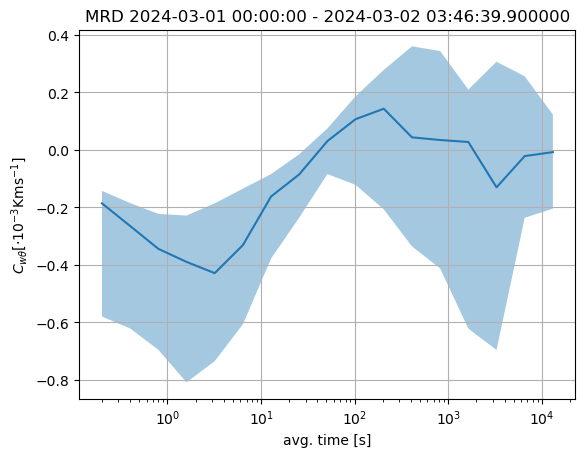

In [5]:
"""DO MRD TO CHECK AVERAGING TIME"""
M=17
(mrd_x, mrd_data, time_middle)=completemrd(fastdata_rot[0:1000000], 'Uz', 'Ts', M, shift=round(int(0.1 * 2**M)), plot=True)

MRD for DataFrame
Number of gaps: 1


 88%|████████▊ | 878169/999999 [08:24<01:10, 1739.83it/s]


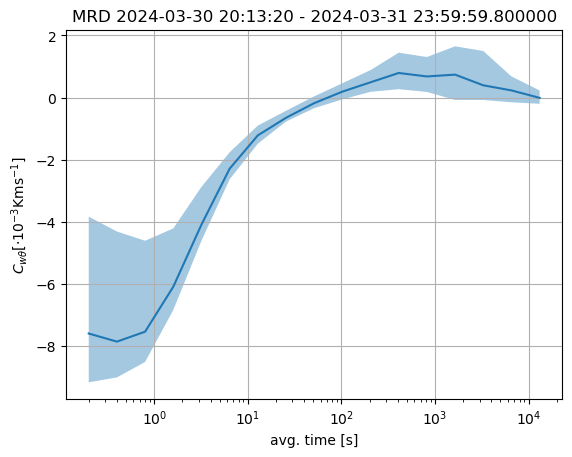

In [6]:
"""DO MRD TO CHECK AVERAGING TIME"""
M=17
(mrd_x, mrd_data, time_middle)=completemrd(fastdata_rot[-1000000:-1], 'Uz', 'Ts', M, shift=round(int(0.1 * 2**M)), plot=True)

/home/engbers/Documents/Github/DataProcessingScripts/EC/Func_MRFD.py:66: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  gaps = pd.concat([gaps, pd.DataFrame({'idx_before_gap': [len(data)],


MRD for DataFrame
Number of gaps: 1


 92%|█████████▏| 1376235/1500000 [20:17<01:49, 1130.60it/s]


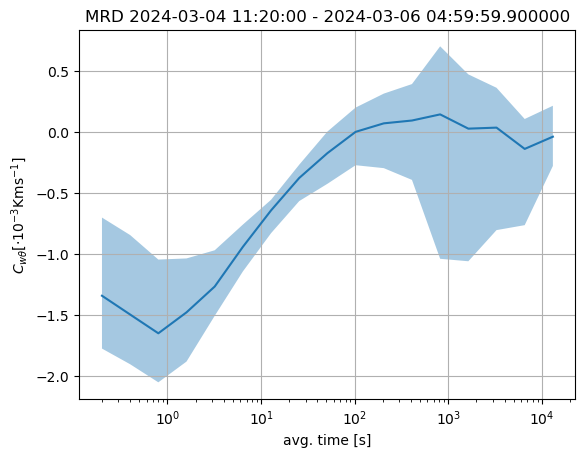

In [23]:
"""DO MRD TO CHECK AVERAGING TIME"""
M=17
(mrd_x, mrd_data, time_middle)=completemrd(fastdata_rot[3000000:4500000], 'Uz', 'Ts', M, shift=round(int(0.1 * 2**M)), plot=True)

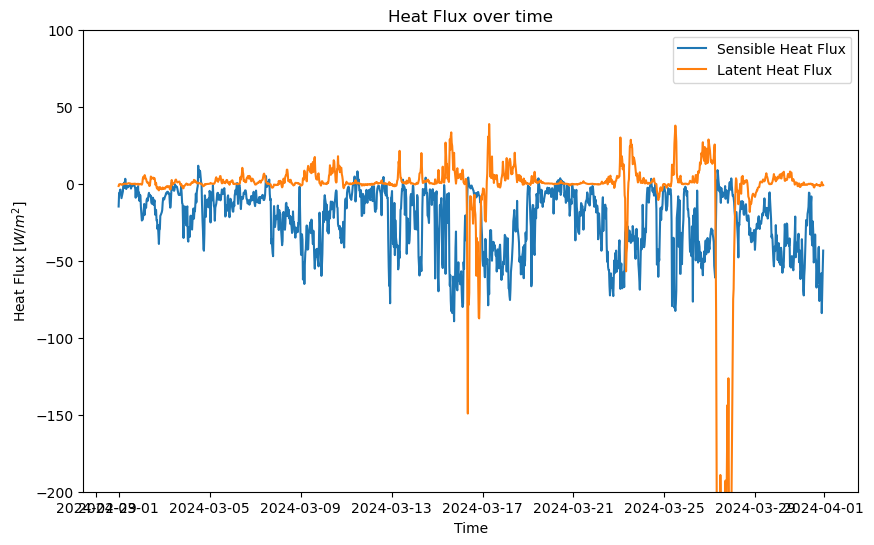

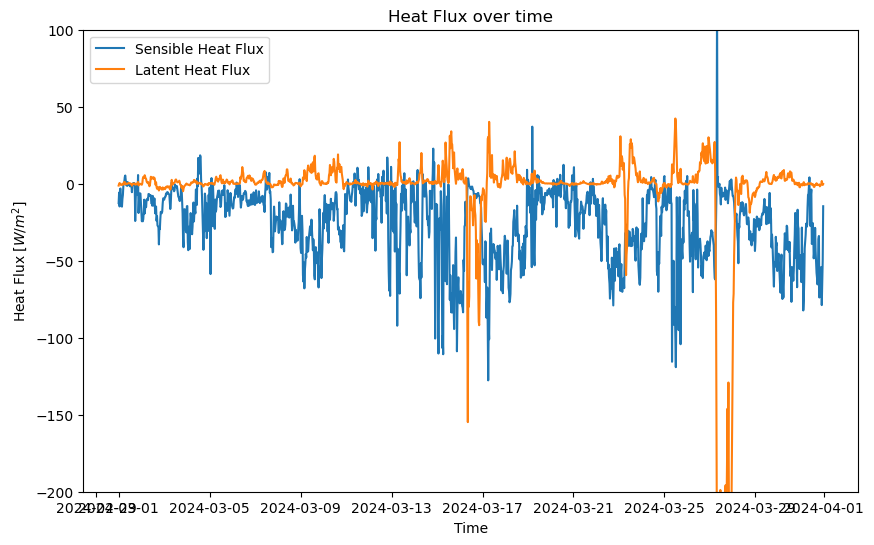

In [13]:
""" CHECK HEATFLUX QUICKLY WITH AVERAGING INTERVAL FOM MRD"""
df_heatflux=check_heat_flux(fastdata_rot, '30s', plot=True)
df_heatflux=check_heat_flux(fastdata_rot, '10min', plot=True)